# 3DBreastNet - 128x128x128 Voxel Reconstruction

## 1. Install Dependencies

In [1]:
!uv pip install torch torchvision tifffile opencv-python numpy scipy scikit-image matplotlib tqdm pandas

Using Python 3.11.9 environment at: /mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/.venv
Checked 10 packages in 6ms


In [2]:
# tqdm.notebook is provided by tqdm; ipywidgets enables the notebook progress UI.
!uv pip install tqdm ipywidgets

Using Python 3.11.9 environment at: /mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/.venv
Checked 2 packages in 4ms


## 2. Model Definitions

In [4]:
"""3DBreastNet — Model definitions (128³ voxel grid)."""
import math, torch, torch.nn as nn, torch.nn.functional as F

# ── Building blocks ──────────────────────────────────────────
class DoubleConv2D(nn.Module):
    def __init__(self, inc, outc, drop=0.2):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(inc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True),
            nn.Dropout2d(drop) if drop > 0 else nn.Identity(),
            nn.Conv2d(outc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True))
    def forward(self, x): return self.block(x)

class DoubleConv3D(nn.Module):
    def __init__(self, inc, outc, drop=0.2):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv3d(inc, outc, 3, padding=1, bias=False),
            nn.BatchNorm3d(outc), nn.ReLU(True),
            nn.Dropout3d(drop) if drop > 0 else nn.Identity(),
            nn.Conv3d(outc, outc, 3, padding=1, bias=False),
            nn.BatchNorm3d(outc), nn.ReLU(True))
    def forward(self, x): return self.block(x)

def _init(m):
    if isinstance(m, (nn.Conv2d, nn.Conv3d, nn.ConvTranspose2d, nn.ConvTranspose3d)):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None: nn.init.constant_(m.bias, 0)
    elif isinstance(m, (nn.BatchNorm2d, nn.BatchNorm3d)):
        nn.init.constant_(m.weight, 1); nn.init.constant_(m.bias, 0)
    elif isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None: nn.init.constant_(m.bias, 0)

# ── U-Net (for mask generation, frozen) ──────────────────────
class DoubleConv(nn.Module):
    def __init__(self, inc, outc, drop=0.0):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(inc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True),
            nn.Conv2d(outc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True),
            nn.Dropout2d(drop) if drop > 0 else nn.Identity())
    def forward(self, x): return self.block(x)

class UNet(nn.Module):
    def __init__(self, in_c=1, out_c=1, b=64, drop=0.2):
        super().__init__()
        self.pool = nn.MaxPool2d(2)
        self.enc1 = DoubleConv(in_c, b, 0.0)
        self.enc2 = DoubleConv(b, b*2, 0.0)
        self.enc3 = DoubleConv(b*2, b*4, 0.1)
        self.enc4 = DoubleConv(b*4, b*8, 0.1)
        self.bottleneck = DoubleConv(b*8, b*16, drop)
        self.up4 = nn.ConvTranspose2d(b*16, b*8, 2, stride=2)
        self.dec4 = DoubleConv(b*16, b*8, 0.1)
        self.up3 = nn.ConvTranspose2d(b*8, b*4, 2, stride=2)
        self.dec3 = DoubleConv(b*8, b*4, 0.1)
        self.up2 = nn.ConvTranspose2d(b*4, b*2, 2, stride=2)
        self.dec2 = DoubleConv(b*4, b*2, 0.0)
        self.up1 = nn.ConvTranspose2d(b*2, b, 2, stride=2)
        self.dec1 = DoubleConv(b*2, b, 0.0)
        self.out = nn.Conv2d(b, out_c, 1)
    def forward(self, x):
        e1=self.enc1(x); e2=self.enc2(self.pool(e1))
        e3=self.enc3(self.pool(e2)); e4=self.enc4(self.pool(e3))
        b=self.bottleneck(self.pool(e4))
        d4=self.dec4(torch.cat([self.up4(b),e4],1))
        d3=self.dec3(torch.cat([self.up3(d4),e3],1))
        d2=self.dec2(torch.cat([self.up2(d3),e2],1))
        d1=self.dec1(torch.cat([self.up1(d2),e1],1))
        return self.out(d1)

# ── Encoder 2D  (5×128×128 → 1000-d latent) ─────────────────
class Encoder2D(nn.Module):
    def __init__(self, drop=0.25):
        super().__init__()
        self.pool = nn.MaxPool2d(2)
        self.enc1 = DoubleConv2D(10, 32, 0)
        self.enc2 = DoubleConv2D(32, 64, 0)
        self.enc3 = DoubleConv2D(64, 128, drop)
        self.enc4 = DoubleConv2D(128, 256, drop)
        self.enc5 = DoubleConv2D(256, 512, drop)
        self.enc6 = DoubleConv2D(512, 512, drop)
        self.fc = nn.Sequential(nn.Dropout(drop), nn.Linear(512*2*2, 1000))
        self.apply(_init)
    def forward(self, x):
        for enc in [self.enc1, self.enc2, self.enc3, self.enc4, self.enc5, self.enc6]:
            x = enc(x); x = self.pool(x)
        return self.fc(x.view(x.size(0), -1))

# ── Decoder 3D  (1000-d → 1×128×128×128) with grad-checkpoint
class Decoder3D(nn.Module):
    def __init__(self, drop=0.25):
        super().__init__()
        self.fc = nn.Linear(1000, 512*2*2*2)
        self.up1=nn.ConvTranspose3d(512,256,2,stride=2); self.d1=DoubleConv3D(256,256,drop)
        self.up2=nn.ConvTranspose3d(256,128,2,stride=2); self.d2=DoubleConv3D(128,128,drop)
        self.up3=nn.ConvTranspose3d(128,64,2,stride=2);  self.d3=DoubleConv3D(64,64,drop)
        self.up4=nn.ConvTranspose3d(64,32,2,stride=2);   self.d4=DoubleConv3D(32,32,0)
        self.up5=nn.ConvTranspose3d(32,16,2,stride=2);   self.d5=DoubleConv3D(16,16,0)
        self.up6=nn.ConvTranspose3d(16,8,2,stride=2);    self.d6=DoubleConv3D(8,8,0)
        self.out = nn.Sequential(nn.Conv3d(8,1,1), nn.Sigmoid())
        self.apply(_init)
        nn.init.constant_(self.out[0].bias, -4.0)   # start near-empty

    def _s4(self, x): return self.d4(self.up4(x))
    def _s5(self, x): return self.d5(self.up5(x))
    def _s6(self, x): return self.d6(self.up6(x))

    def forward(self, x):
        x = self.fc(x).view(x.size(0), 512, 2, 2, 2)
        x = self.d1(self.up1(x))
        x = self.d2(self.up2(x))
        x = self.d3(self.up3(x))
        if x.requires_grad:
            x = torch.utils.checkpoint.checkpoint(self._s4, x, use_reentrant=False)
            x = torch.utils.checkpoint.checkpoint(self._s5, x, use_reentrant=False)
            x = torch.utils.checkpoint.checkpoint(self._s6, x, use_reentrant=False)
        else:
            x = self._s4(x); x = self._s5(x); x = self._s6(x)
        return self.out(x)

# ── Differentiable projection (Eq. 1-3 from paper) ──────────
# Runs in pure float32 (isolated from autocast in train.py)
def render_projection(volume, theta_deg):
    B,C,D,H,W = volume.shape; dev = volume.device
    if not isinstance(theta_deg, torch.Tensor):
        theta_deg = torch.full((B,), float(theta_deg), device=dev, dtype=torch.float32)
    theta_deg = theta_deg.float()
    rad = theta_deg * math.pi / 180.0
    c, s = torch.cos(rad), torch.sin(rad)
    z, o = torch.zeros_like(rad), torch.ones_like(rad)
    mat = torch.stack([torch.stack([c,z,s,z],-1),
                       torch.stack([z,o,z,z],-1),
                       torch.stack([-s,z,c,z],-1)], -2)
    grid = F.affine_grid(mat, volume.shape, align_corners=False)
    Vr = F.grid_sample(volume, grid, mode='bilinear', padding_mode='zeros', align_corners=False)
    return 1.0 - torch.exp(-Vr.squeeze(1).sum(dim=1, keepdim=True))

# ── Dice loss (Eq. 7) — float32-safe ────────────────────────
def dice_loss(pred, target, eps=1e-6):
    p, t = pred.float(), target.float()
    num = 2*(p*t).sum()
    den = p.pow(2).sum() + t.pow(2).sum() + eps
    return 1 - num/den

VIEW_WINDOWS = [(-90.,-67.5),(-67.5,-22.5),(-22.5,22.5),(22.5,67.5),(67.5,90.)]


## 3. Training

In [13]:
"""3DBreastNet — Dual-Input Hybrid Training script for 128³ voxel reconstruction.
Usage:  python train.py
"""
import os, sys, time, random, json, math, glob
import numpy as np, cv2, tifffile, pandas as pd
import matplotlib; matplotlib.use("Agg")
import matplotlib.pyplot as plt
from pathlib import Path
from dataclasses import dataclass
from typing import List, Dict
from tqdm.auto import tqdm

import torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import scipy.ndimage

# --- CONFIG ---
CFG = {
    "epochs":       400,
    "batch_size":   2,
    "lr":           1e-4,
    "betas":        (0.5, 0.9),
    "n_per_view":   2,
    "seed":         42,
    "patience":     50,
    "ckpt_dir":     "checkpoints_3d",
    "otsu_dir":     r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient_otsu",
    "unet_dir":     r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient_unet",
}

# --- DATA ---
def build_hybrid_patients(otsu_dir, unet_dir):
    otsu_p = set([f for f in os.listdir(otsu_dir) if f.startswith('Patient_')])
    unet_p = set([f for f in os.listdir(unet_dir) if f.startswith('Patient_')])
    valid_patients = sorted(list(otsu_p.intersection(unet_p)))
    
    benign, malignant = [], []
    for p in valid_patients:
        subs = [d for d in os.listdir(os.path.join(otsu_dir, p)) if os.path.isdir(os.path.join(otsu_dir, p, d))]
        if not subs: continue
        cat = subs[0]
        if "benign" in cat.lower(): benign.append((p, cat))
        else: malignant.append((p, cat))
        
    print(f"Patients: {len(valid_patients)} | B={len(benign)} M={len(malignant)}")
    return benign, malignant

class HybridPatientDataset(Dataset):
    def __init__(self, patient_tuples, otsu_dir, unet_dir, img_sz=128):
        self.patients = patient_tuples
        self.otsu_dir = otsu_dir
        self.unet_dir = unet_dir
        self.img_sz = img_sz
        self.views = ['Right Lateral', 'Right Oblique', 'Anterior', 'Left Oblique', 'Left Lateral']
        
    def __len__(self): return len(self.patients)
    
    def __getitem__(self, idx):
        pid, cat = self.patients[idx]
        otsu_full = os.path.join(self.otsu_dir, pid, cat)
        unet_full = os.path.join(self.unet_dir, pid, cat)
        
        otsu_tensors, unet_tensors = [], []
        for view in self.views:
            # 1. Otsu (Context)
            of = [f for f in glob.glob(os.path.join(otsu_full, "*.png")) if view in os.path.basename(f)]
            if of:
                m = cv2.imdecode(np.fromfile(of[0], dtype=np.uint8), cv2.IMREAD_GRAYSCALE)
                m = cv2.resize(m, (self.img_sz, self.img_sz), interpolation=cv2.INTER_NEAREST)
                otsu_tensors.append(torch.from_numpy(m).float() / 255.0)
            else:
                otsu_tensors.append(torch.zeros((self.img_sz, self.img_sz), dtype=torch.float32))
                
            # 2. U-Net (Target)
            uf = [f for f in glob.glob(os.path.join(unet_full, "*.png")) if view in os.path.basename(f)]
            if uf:
                m = cv2.imdecode(np.fromfile(uf[0], dtype=np.uint8), cv2.IMREAD_GRAYSCALE)
                m = cv2.resize(m, (self.img_sz, self.img_sz), interpolation=cv2.INTER_NEAREST)
                unet_tensors.append(torch.from_numpy(m).float() / 255.0)
            else:
                unet_tensors.append(torch.zeros((self.img_sz, self.img_sz), dtype=torch.float32))
        
        otsu_stack = torch.stack(otsu_tensors, dim=0)
        unet_stack = torch.stack(unet_tensors, dim=0)
        input_10ch = torch.cat([otsu_stack, unet_stack], dim=0)
        
        return {
            "input_10ch": input_10ch,
            "target_5ch": unet_stack,
            "patient_id": pid,
            "label": cat
        }

# --- METRICS ---
def hd95(p, t):
    if p.sum()==0 or t.sum()==0: return 128.0
    pe = p ^ scipy.ndimage.binary_erosion(p)
    te = t ^ scipy.ndimage.binary_erosion(t)
    dtp = scipy.ndimage.distance_transform_edt(~pe)
    dtt = scipy.ndimage.distance_transform_edt(~te)
    d1 = np.percentile(dtt[pe], 95) if pe.sum()>0 else 128.0
    d2 = np.percentile(dtp[te], 95) if te.sum()>0 else 128.0
    return max(d1, d2)

# --- TRAIN ---
def train(cfg):
    torch.manual_seed(cfg["seed"]); np.random.seed(cfg["seed"])
    torch.cuda.manual_seed_all(cfg["seed"])
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Device: {device}")

    # Data
    benign, malignant = build_hybrid_patients(cfg["otsu_dir"], cfg["unet_dir"])
    rng = random.Random(cfg["seed"])
    rng.shuffle(benign); rng.shuffle(malignant)
    s = 0.78
    trn = benign[:int(len(benign)*s)] + malignant[:int(len(malignant)*s)]
    val = benign[int(len(benign)*s):] + malignant[int(len(malignant)*s):]
    print(f"Train: {len(trn)} | Val: {len(val)}")

    trn_dl = DataLoader(HybridPatientDataset(trn, cfg["otsu_dir"], cfg["unet_dir"]),
                        batch_size=cfg["batch_size"], shuffle=True, drop_last=True)
    val_dl = DataLoader(HybridPatientDataset(val, cfg["otsu_dir"], cfg["unet_dir"]),
                        batch_size=cfg["batch_size"], shuffle=False)

    # Models
    enc = Encoder2D().to(device)
    dec = Decoder3D().to(device)
    opt = torch.optim.Adam(list(enc.parameters())+list(dec.parameters()),
                           lr=cfg["lr"], betas=cfg["betas"])
    sched = torch.optim.lr_scheduler.ReduceLROnPlateau(
        opt, mode="max", factor=0.5, patience=30, min_lr=1e-6)
    scaler = torch.amp.GradScaler("cuda", enabled=torch.cuda.is_available())
    Path(cfg["ckpt_dir"]).mkdir(parents=True, exist_ok=True)

    best_dice, no_imp = 0.0, 0
    hist = {"epoch":[], "train_loss":[], "val_loss":[], "val_dice":[], "val_hd":[]}
    val_angles = [-90., -45., 0., 45., 90.]

    for epoch in range(1, cfg["epochs"]+1):
        t0 = time.time()
        # -- train --
        enc.train(); dec.train()
        ep_loss = 0.0
        for batch in tqdm(trn_dl, desc=f"E{epoch:03d} train", leave=False):
            inp10 = batch["input_10ch"].to(device)
            tgt5 = batch["target_5ch"].to(device)
            B = inp10.size(0)
            
            opt.zero_grad(set_to_none=True)
            with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
                vol = dec(enc(inp10))
            
            vol = vol.float()
            loss = torch.tensor(0.0, device=device)
            for i in range(5):
                lo, hi = VIEW_WINDOWS[i]
                for _ in range(cfg["n_per_view"]):
                    th = torch.rand(B, device=device)*(hi-lo)+lo
                    loss = loss + dice_loss(render_projection(vol, th), tgt5[:, i:i+1])
                    
            loss = loss / (5*cfg["n_per_view"])
            scaler.scale(loss).backward()
            scaler.unscale_(opt)
            if torch.isfinite(loss):
                torch.nn.utils.clip_grad_norm_(list(enc.parameters())+list(dec.parameters()), 1.0)
                scaler.step(opt)
            else:
                print(f"  ⚠ NaN loss in epoch {epoch}, skipping batch")
            scaler.update()
            ep_loss += loss.item() if torch.isfinite(loss) else 0.0
        ep_loss /= max(len(trn_dl), 1)

        # -- val --
        enc.eval(); dec.eval()
        vl, vd, vh, cnt = 0., 0., 0., 0
        with torch.no_grad():
            for batch in tqdm(val_dl, desc=f"E{epoch:03d} val", leave=False):
                inp10 = batch["input_10ch"].to(device)
                tgt5 = batch["target_5ch"].to(device)
                B = inp10.size(0)
                
                with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
                    vol = dec(enc(inp10))
                
                vol = vol.float()
                for i in range(5):
                    th = torch.full((B,), val_angles[i], device=device)
                    proj = render_projection(vol, th)
                    dl = dice_loss(proj, tgt5[:, i:i+1])
                    vl += dl.item(); vd += (1-dl).item()
                    
                    pb = (proj>0.5).cpu().numpy()
                    mb = (tgt5[:, i:i+1]>0.5).cpu().numpy()
                    for b in range(B): vh += hd95(pb[b,0], mb[b,0]); cnt += 1
                    
        vl /= max(len(val_dl)*5,1); vd /= max(len(val_dl)*5,1)
        vh /= max(cnt,1)
        elapsed = time.time()-t0

        hist["epoch"].append(epoch); hist["train_loss"].append(ep_loss)
        hist["val_loss"].append(vl); hist["val_dice"].append(vd); hist["val_hd"].append(vh)
        sched.step(vd)

        lr_now = opt.param_groups[0]["lr"]
        print(f"E{epoch:03d} | loss={ep_loss:.4f} | vl={vl:.4f} vd={vd:.4f} "
              f"hd={vh:.2f} | lr={lr_now:.6f} | {elapsed:.1f}s")

        ckpt = {"epoch": epoch, "enc": enc.state_dict(), "dec": dec.state_dict(),
                "opt": opt.state_dict(), "best_dice": max(best_dice,vd),
                "cfg": cfg, "hist": hist}
        torch.save(ckpt, Path(cfg["ckpt_dir"])/"3dbreastnet_last.pth")
        if vd > best_dice:
            best_dice = vd; no_imp = 0
            torch.save(ckpt, Path(cfg["ckpt_dir"])/"3dbreastnet_best.pth")
            print(f"  ★ new best dice={best_dice:.4f}")
        else:
            no_imp += 1
            if no_imp >= cfg["patience"]:
                print(f"Early stopping @ epoch {epoch}"); break

    # -- plot --
    fig, ax = plt.subplots(1, 3, figsize=(18, 5))
    ax[0].plot(hist["epoch"], hist["train_loss"], label="train"); ax[0].plot(hist["epoch"], hist["val_loss"], label="val")
    ax[0].set_title("Dice Loss"); ax[0].legend()
    ax[1].plot(hist["epoch"], hist["val_dice"], color="green"); ax[1].set_title("Val Dice")
    ax[2].plot(hist["epoch"], hist["val_hd"], color="red"); ax[2].set_title("Val HD95")
    for a in ax: a.set_xlabel("Epoch")
    plt.tight_layout(); plt.savefig(Path(cfg["ckpt_dir"])/"training_history.png", dpi=150)
    print(f"Plot saved. Best dice={best_dice:.4f}")

if __name__ == "__main__":
    train(CFG)

Device: cuda
Patients: 137 | B=108 M=29
Train: 106 | Val: 31


E001 train:   0%|          | 0/53 [00:00<?, ?it/s]

E001 val:   0%|          | 0/16 [00:00<?, ?it/s]

E001 | loss=0.5544 | vl=0.4600 vd=0.5400 hd=55.21 | lr=0.000100 | 10.6s
  ★ new best dice=0.5400


E002 train:   0%|          | 0/53 [00:00<?, ?it/s]

E002 val:   0%|          | 0/16 [00:00<?, ?it/s]

E002 | loss=0.4443 | vl=0.4012 vd=0.5988 hd=50.13 | lr=0.000100 | 10.6s
  ★ new best dice=0.5988


E003 train:   0%|          | 0/53 [00:00<?, ?it/s]

E003 val:   0%|          | 0/16 [00:00<?, ?it/s]

E003 | loss=0.3875 | vl=0.3506 vd=0.6494 hd=31.93 | lr=0.000100 | 10.7s
  ★ new best dice=0.6494


E004 train:   0%|          | 0/53 [00:00<?, ?it/s]

E004 val:   0%|          | 0/16 [00:00<?, ?it/s]

E004 | loss=0.3606 | vl=0.3310 vd=0.6690 hd=28.60 | lr=0.000100 | 10.6s
  ★ new best dice=0.6690


E005 train:   0%|          | 0/53 [00:00<?, ?it/s]

E005 val:   0%|          | 0/16 [00:00<?, ?it/s]

E005 | loss=0.3416 | vl=0.3160 vd=0.6840 hd=29.58 | lr=0.000100 | 10.7s
  ★ new best dice=0.6840


E006 train:   0%|          | 0/53 [00:00<?, ?it/s]

E006 val:   0%|          | 0/16 [00:00<?, ?it/s]

E006 | loss=0.3221 | vl=0.3043 vd=0.6957 hd=27.61 | lr=0.000100 | 10.7s
  ★ new best dice=0.6957


E007 train:   0%|          | 0/53 [00:00<?, ?it/s]

E007 val:   0%|          | 0/16 [00:00<?, ?it/s]

E007 | loss=0.3101 | vl=0.2856 vd=0.7144 hd=27.06 | lr=0.000100 | 10.7s
  ★ new best dice=0.7144


E008 train:   0%|          | 0/53 [00:00<?, ?it/s]

E008 val:   0%|          | 0/16 [00:00<?, ?it/s]

E008 | loss=0.2986 | vl=0.2687 vd=0.7313 hd=26.00 | lr=0.000100 | 10.7s
  ★ new best dice=0.7313


E009 train:   0%|          | 0/53 [00:00<?, ?it/s]

E009 val:   0%|          | 0/16 [00:00<?, ?it/s]

E009 | loss=0.2868 | vl=0.2708 vd=0.7292 hd=25.23 | lr=0.000100 | 10.9s


E010 train:   0%|          | 0/53 [00:00<?, ?it/s]

E010 val:   0%|          | 0/16 [00:00<?, ?it/s]

E010 | loss=0.2828 | vl=0.2626 vd=0.7374 hd=24.83 | lr=0.000100 | 10.8s
  ★ new best dice=0.7374


E011 train:   0%|          | 0/53 [00:00<?, ?it/s]

E011 val:   0%|          | 0/16 [00:00<?, ?it/s]

E011 | loss=0.2761 | vl=0.2540 vd=0.7460 hd=24.85 | lr=0.000100 | 10.7s
  ★ new best dice=0.7460


E012 train:   0%|          | 0/53 [00:00<?, ?it/s]

E012 val:   0%|          | 0/16 [00:00<?, ?it/s]

E012 | loss=0.2707 | vl=0.2544 vd=0.7456 hd=24.93 | lr=0.000100 | 10.7s


E013 train:   0%|          | 0/53 [00:00<?, ?it/s]

E013 val:   0%|          | 0/16 [00:00<?, ?it/s]

E013 | loss=0.2660 | vl=0.2471 vd=0.7529 hd=24.48 | lr=0.000100 | 10.6s
  ★ new best dice=0.7529


E014 train:   0%|          | 0/53 [00:00<?, ?it/s]

E014 val:   0%|          | 0/16 [00:00<?, ?it/s]

E014 | loss=0.2583 | vl=0.2331 vd=0.7669 hd=23.49 | lr=0.000100 | 10.6s
  ★ new best dice=0.7669


E015 train:   0%|          | 0/53 [00:00<?, ?it/s]

E015 val:   0%|          | 0/16 [00:00<?, ?it/s]

E015 | loss=0.2587 | vl=0.2303 vd=0.7697 hd=23.77 | lr=0.000100 | 10.6s
  ★ new best dice=0.7697


E016 train:   0%|          | 0/53 [00:00<?, ?it/s]

E016 val:   0%|          | 0/16 [00:00<?, ?it/s]

E016 | loss=0.2518 | vl=0.2290 vd=0.7710 hd=20.34 | lr=0.000100 | 10.8s
  ★ new best dice=0.7710


E017 train:   0%|          | 0/53 [00:00<?, ?it/s]

E017 val:   0%|          | 0/16 [00:00<?, ?it/s]

E017 | loss=0.2388 | vl=0.2226 vd=0.7774 hd=20.64 | lr=0.000100 | 10.6s
  ★ new best dice=0.7774


E018 train:   0%|          | 0/53 [00:00<?, ?it/s]

E018 val:   0%|          | 0/16 [00:00<?, ?it/s]

E018 | loss=0.2443 | vl=0.2207 vd=0.7793 hd=22.45 | lr=0.000100 | 10.6s
  ★ new best dice=0.7793


E019 train:   0%|          | 0/53 [00:00<?, ?it/s]

E019 val:   0%|          | 0/16 [00:00<?, ?it/s]

E019 | loss=0.2386 | vl=0.2198 vd=0.7802 hd=22.60 | lr=0.000100 | 10.6s
  ★ new best dice=0.7802


E020 train:   0%|          | 0/53 [00:00<?, ?it/s]

E020 val:   0%|          | 0/16 [00:00<?, ?it/s]

E020 | loss=0.2363 | vl=0.2095 vd=0.7905 hd=21.92 | lr=0.000100 | 10.6s
  ★ new best dice=0.7905


E021 train:   0%|          | 0/53 [00:00<?, ?it/s]

E021 val:   0%|          | 0/16 [00:00<?, ?it/s]

E021 | loss=0.2304 | vl=0.2091 vd=0.7909 hd=21.93 | lr=0.000100 | 10.6s
  ★ new best dice=0.7909


E022 train:   0%|          | 0/53 [00:00<?, ?it/s]

E022 val:   0%|          | 0/16 [00:00<?, ?it/s]

E022 | loss=0.2330 | vl=0.2192 vd=0.7808 hd=22.83 | lr=0.000100 | 10.6s


E023 train:   0%|          | 0/53 [00:00<?, ?it/s]

E023 val:   0%|          | 0/16 [00:00<?, ?it/s]

E023 | loss=0.2225 | vl=0.1975 vd=0.8025 hd=20.25 | lr=0.000100 | 10.6s
  ★ new best dice=0.8025


E024 train:   0%|          | 0/53 [00:00<?, ?it/s]

E024 val:   0%|          | 0/16 [00:00<?, ?it/s]

E024 | loss=0.2238 | vl=0.1987 vd=0.8013 hd=20.71 | lr=0.000100 | 10.6s


E025 train:   0%|          | 0/53 [00:00<?, ?it/s]

E025 val:   0%|          | 0/16 [00:00<?, ?it/s]

E025 | loss=0.2190 | vl=0.1959 vd=0.8041 hd=23.86 | lr=0.000100 | 10.6s
  ★ new best dice=0.8041


E026 train:   0%|          | 0/53 [00:00<?, ?it/s]

E026 val:   0%|          | 0/16 [00:00<?, ?it/s]

E026 | loss=0.2185 | vl=0.1931 vd=0.8069 hd=22.48 | lr=0.000100 | 10.8s
  ★ new best dice=0.8069


E027 train:   0%|          | 0/53 [00:00<?, ?it/s]

E027 val:   0%|          | 0/16 [00:00<?, ?it/s]

E027 | loss=0.2153 | vl=0.1937 vd=0.8063 hd=20.57 | lr=0.000100 | 10.7s


E028 train:   0%|          | 0/53 [00:00<?, ?it/s]

E028 val:   0%|          | 0/16 [00:00<?, ?it/s]

E028 | loss=0.2178 | vl=0.1903 vd=0.8097 hd=20.39 | lr=0.000100 | 10.7s
  ★ new best dice=0.8097


E029 train:   0%|          | 0/53 [00:00<?, ?it/s]

E029 val:   0%|          | 0/16 [00:00<?, ?it/s]

E029 | loss=0.2156 | vl=0.1977 vd=0.8023 hd=20.86 | lr=0.000100 | 10.6s


E030 train:   0%|          | 0/53 [00:00<?, ?it/s]

E030 val:   0%|          | 0/16 [00:00<?, ?it/s]

E030 | loss=0.2050 | vl=0.1964 vd=0.8036 hd=21.54 | lr=0.000100 | 10.8s


E031 train:   0%|          | 0/53 [00:00<?, ?it/s]

E031 val:   0%|          | 0/16 [00:00<?, ?it/s]

E031 | loss=0.2030 | vl=0.1919 vd=0.8081 hd=20.80 | lr=0.000100 | 10.8s


E032 train:   0%|          | 0/53 [00:00<?, ?it/s]

E032 val:   0%|          | 0/16 [00:00<?, ?it/s]

E032 | loss=0.2066 | vl=0.2057 vd=0.7943 hd=24.18 | lr=0.000100 | 10.7s


E033 train:   0%|          | 0/53 [00:00<?, ?it/s]

E033 val:   0%|          | 0/16 [00:00<?, ?it/s]

E033 | loss=0.2028 | vl=0.1881 vd=0.8119 hd=21.17 | lr=0.000100 | 10.6s
  ★ new best dice=0.8119


E034 train:   0%|          | 0/53 [00:00<?, ?it/s]

E034 val:   0%|          | 0/16 [00:00<?, ?it/s]

E034 | loss=0.1995 | vl=0.1837 vd=0.8163 hd=21.43 | lr=0.000100 | 10.8s
  ★ new best dice=0.8163


E035 train:   0%|          | 0/53 [00:00<?, ?it/s]

E035 val:   0%|          | 0/16 [00:00<?, ?it/s]

E035 | loss=0.1987 | vl=0.1781 vd=0.8219 hd=19.56 | lr=0.000100 | 10.6s
  ★ new best dice=0.8219


E036 train:   0%|          | 0/53 [00:00<?, ?it/s]

E036 val:   0%|          | 0/16 [00:00<?, ?it/s]

E036 | loss=0.1990 | vl=0.1830 vd=0.8170 hd=19.88 | lr=0.000100 | 10.7s


E037 train:   0%|          | 0/53 [00:00<?, ?it/s]

E037 val:   0%|          | 0/16 [00:00<?, ?it/s]

E037 | loss=0.1925 | vl=0.1894 vd=0.8106 hd=20.52 | lr=0.000100 | 10.6s


E038 train:   0%|          | 0/53 [00:00<?, ?it/s]

E038 val:   0%|          | 0/16 [00:00<?, ?it/s]

E038 | loss=0.1976 | vl=0.1806 vd=0.8194 hd=19.72 | lr=0.000100 | 10.6s


E039 train:   0%|          | 0/53 [00:00<?, ?it/s]

E039 val:   0%|          | 0/16 [00:00<?, ?it/s]

E039 | loss=0.1977 | vl=0.1720 vd=0.8280 hd=20.32 | lr=0.000100 | 10.6s
  ★ new best dice=0.8280


E040 train:   0%|          | 0/53 [00:00<?, ?it/s]

E040 val:   0%|          | 0/16 [00:00<?, ?it/s]

E040 | loss=0.1890 | vl=0.1793 vd=0.8207 hd=19.30 | lr=0.000100 | 10.6s


E041 train:   0%|          | 0/53 [00:00<?, ?it/s]

E041 val:   0%|          | 0/16 [00:00<?, ?it/s]

E041 | loss=0.1862 | vl=0.1837 vd=0.8163 hd=19.83 | lr=0.000100 | 10.6s


E042 train:   0%|          | 0/53 [00:00<?, ?it/s]

E042 val:   0%|          | 0/16 [00:00<?, ?it/s]

E042 | loss=0.1910 | vl=0.1785 vd=0.8215 hd=19.36 | lr=0.000100 | 10.8s


E043 train:   0%|          | 0/53 [00:00<?, ?it/s]

E043 val:   0%|          | 0/16 [00:00<?, ?it/s]

E043 | loss=0.1877 | vl=0.1812 vd=0.8188 hd=19.67 | lr=0.000100 | 10.6s


E044 train:   0%|          | 0/53 [00:00<?, ?it/s]

E044 val:   0%|          | 0/16 [00:00<?, ?it/s]

E044 | loss=0.1846 | vl=0.1753 vd=0.8247 hd=19.21 | lr=0.000100 | 10.6s


E045 train:   0%|          | 0/53 [00:00<?, ?it/s]

E045 val:   0%|          | 0/16 [00:00<?, ?it/s]

E045 | loss=0.1854 | vl=0.1878 vd=0.8122 hd=19.85 | lr=0.000100 | 10.7s


E046 train:   0%|          | 0/53 [00:00<?, ?it/s]

E046 val:   0%|          | 0/16 [00:00<?, ?it/s]

E046 | loss=0.1876 | vl=0.1730 vd=0.8270 hd=19.82 | lr=0.000100 | 10.9s


E047 train:   0%|          | 0/53 [00:00<?, ?it/s]

E047 val:   0%|          | 0/16 [00:00<?, ?it/s]

E047 | loss=0.1846 | vl=0.1770 vd=0.8230 hd=20.44 | lr=0.000100 | 10.6s


E048 train:   0%|          | 0/53 [00:00<?, ?it/s]

E048 val:   0%|          | 0/16 [00:00<?, ?it/s]

E048 | loss=0.1835 | vl=0.1708 vd=0.8292 hd=20.28 | lr=0.000100 | 10.6s
  ★ new best dice=0.8292


E049 train:   0%|          | 0/53 [00:00<?, ?it/s]

E049 val:   0%|          | 0/16 [00:00<?, ?it/s]

E049 | loss=0.1837 | vl=0.1783 vd=0.8217 hd=21.00 | lr=0.000100 | 10.7s


E050 train:   0%|          | 0/53 [00:00<?, ?it/s]

E050 val:   0%|          | 0/16 [00:00<?, ?it/s]

E050 | loss=0.1776 | vl=0.1691 vd=0.8309 hd=19.57 | lr=0.000100 | 10.6s
  ★ new best dice=0.8309


E051 train:   0%|          | 0/53 [00:00<?, ?it/s]

E051 val:   0%|          | 0/16 [00:00<?, ?it/s]

E051 | loss=0.1817 | vl=0.1749 vd=0.8251 hd=20.85 | lr=0.000100 | 10.6s


E052 train:   0%|          | 0/53 [00:00<?, ?it/s]

E052 val:   0%|          | 0/16 [00:00<?, ?it/s]

E052 | loss=0.1779 | vl=0.1803 vd=0.8197 hd=19.68 | lr=0.000100 | 10.6s


E053 train:   0%|          | 0/53 [00:00<?, ?it/s]

E053 val:   0%|          | 0/16 [00:00<?, ?it/s]

E053 | loss=0.1813 | vl=0.1667 vd=0.8333 hd=20.32 | lr=0.000100 | 10.7s
  ★ new best dice=0.8333


E054 train:   0%|          | 0/53 [00:00<?, ?it/s]

E054 val:   0%|          | 0/16 [00:00<?, ?it/s]

E054 | loss=0.1775 | vl=0.1662 vd=0.8338 hd=19.00 | lr=0.000100 | 20.5s
  ★ new best dice=0.8338


E055 train:   0%|          | 0/53 [00:00<?, ?it/s]

E055 val:   0%|          | 0/16 [00:00<?, ?it/s]

E055 | loss=0.1748 | vl=0.1669 vd=0.8331 hd=19.79 | lr=0.000100 | 19.8s


E056 train:   0%|          | 0/53 [00:00<?, ?it/s]

E056 val:   0%|          | 0/16 [00:00<?, ?it/s]

E056 | loss=0.1720 | vl=0.1697 vd=0.8303 hd=19.17 | lr=0.000100 | 19.9s


E057 train:   0%|          | 0/53 [00:00<?, ?it/s]

E057 val:   0%|          | 0/16 [00:00<?, ?it/s]

E057 | loss=0.1776 | vl=0.1692 vd=0.8308 hd=19.21 | lr=0.000100 | 20.3s


E058 train:   0%|          | 0/53 [00:00<?, ?it/s]

E058 val:   0%|          | 0/16 [00:00<?, ?it/s]

E058 | loss=0.1816 | vl=0.1754 vd=0.8246 hd=20.08 | lr=0.000100 | 20.0s


E059 train:   0%|          | 0/53 [00:00<?, ?it/s]

E059 val:   0%|          | 0/16 [00:00<?, ?it/s]

E059 | loss=0.1740 | vl=0.1698 vd=0.8302 hd=19.24 | lr=0.000100 | 20.3s


E060 train:   0%|          | 0/53 [00:00<?, ?it/s]

E060 val:   0%|          | 0/16 [00:00<?, ?it/s]

E060 | loss=0.1706 | vl=0.1756 vd=0.8244 hd=19.87 | lr=0.000100 | 19.6s


E061 train:   0%|          | 0/53 [00:00<?, ?it/s]

E061 val:   0%|          | 0/16 [00:00<?, ?it/s]

E061 | loss=0.1703 | vl=0.1674 vd=0.8326 hd=19.04 | lr=0.000100 | 20.5s


E062 train:   0%|          | 0/53 [00:00<?, ?it/s]

E062 val:   0%|          | 0/16 [00:00<?, ?it/s]

E062 | loss=0.1711 | vl=0.1725 vd=0.8275 hd=18.91 | lr=0.000100 | 19.8s


E063 train:   0%|          | 0/53 [00:00<?, ?it/s]

E063 val:   0%|          | 0/16 [00:00<?, ?it/s]

E063 | loss=0.1697 | vl=0.1767 vd=0.8233 hd=20.17 | lr=0.000100 | 20.0s


E064 train:   0%|          | 0/53 [00:00<?, ?it/s]

E064 val:   0%|          | 0/16 [00:00<?, ?it/s]

E064 | loss=0.1746 | vl=0.1652 vd=0.8348 hd=18.68 | lr=0.000100 | 19.7s
  ★ new best dice=0.8348


E065 train:   0%|          | 0/53 [00:00<?, ?it/s]

E065 val:   0%|          | 0/16 [00:00<?, ?it/s]

E065 | loss=0.1678 | vl=0.1608 vd=0.8392 hd=20.00 | lr=0.000100 | 20.5s
  ★ new best dice=0.8392


E066 train:   0%|          | 0/53 [00:00<?, ?it/s]

E066 val:   0%|          | 0/16 [00:00<?, ?it/s]

E066 | loss=0.1697 | vl=0.1657 vd=0.8343 hd=19.13 | lr=0.000100 | 19.8s


E067 train:   0%|          | 0/53 [00:00<?, ?it/s]

E067 val:   0%|          | 0/16 [00:00<?, ?it/s]

E067 | loss=0.1691 | vl=0.1708 vd=0.8292 hd=19.54 | lr=0.000100 | 20.2s


E068 train:   0%|          | 0/53 [00:00<?, ?it/s]

E068 val:   0%|          | 0/16 [00:00<?, ?it/s]

E068 | loss=0.1695 | vl=0.1636 vd=0.8364 hd=19.96 | lr=0.000100 | 17.1s


E069 train:   0%|          | 0/53 [00:00<?, ?it/s]

E069 val:   0%|          | 0/16 [00:00<?, ?it/s]

E069 | loss=0.1648 | vl=0.1774 vd=0.8226 hd=19.42 | lr=0.000100 | 10.6s


E070 train:   0%|          | 0/53 [00:00<?, ?it/s]

E070 val:   0%|          | 0/16 [00:00<?, ?it/s]

E070 | loss=0.1651 | vl=0.1684 vd=0.8316 hd=18.26 | lr=0.000100 | 10.7s


E071 train:   0%|          | 0/53 [00:00<?, ?it/s]

E071 val:   0%|          | 0/16 [00:00<?, ?it/s]

E071 | loss=0.1666 | vl=0.1719 vd=0.8281 hd=18.86 | lr=0.000100 | 10.6s


E072 train:   0%|          | 0/53 [00:00<?, ?it/s]

E072 val:   0%|          | 0/16 [00:00<?, ?it/s]

E072 | loss=0.1656 | vl=0.1698 vd=0.8302 hd=20.50 | lr=0.000100 | 10.6s


E073 train:   0%|          | 0/53 [00:00<?, ?it/s]

E073 val:   0%|          | 0/16 [00:00<?, ?it/s]

E073 | loss=0.1652 | vl=0.1625 vd=0.8375 hd=19.47 | lr=0.000100 | 10.6s


E074 train:   0%|          | 0/53 [00:00<?, ?it/s]

E074 val:   0%|          | 0/16 [00:00<?, ?it/s]

E074 | loss=0.1637 | vl=0.1650 vd=0.8350 hd=18.75 | lr=0.000100 | 10.7s


E075 train:   0%|          | 0/53 [00:00<?, ?it/s]

E075 val:   0%|          | 0/16 [00:00<?, ?it/s]

E075 | loss=0.1662 | vl=0.1654 vd=0.8346 hd=19.21 | lr=0.000100 | 10.7s


E076 train:   0%|          | 0/53 [00:00<?, ?it/s]

E076 val:   0%|          | 0/16 [00:00<?, ?it/s]

E076 | loss=0.1664 | vl=0.1739 vd=0.8261 hd=19.26 | lr=0.000100 | 10.7s


E077 train:   0%|          | 0/53 [00:00<?, ?it/s]

E077 val:   0%|          | 0/16 [00:00<?, ?it/s]

E077 | loss=0.1634 | vl=0.1703 vd=0.8297 hd=19.32 | lr=0.000100 | 11.1s


E078 train:   0%|          | 0/53 [00:00<?, ?it/s]

E078 val:   0%|          | 0/16 [00:00<?, ?it/s]

E078 | loss=0.1692 | vl=0.1649 vd=0.8351 hd=18.62 | lr=0.000100 | 10.6s


E079 train:   0%|          | 0/53 [00:00<?, ?it/s]

E079 val:   0%|          | 0/16 [00:00<?, ?it/s]

E079 | loss=0.1663 | vl=0.1663 vd=0.8337 hd=20.12 | lr=0.000100 | 10.9s


E080 train:   0%|          | 0/53 [00:00<?, ?it/s]

E080 val:   0%|          | 0/16 [00:00<?, ?it/s]

E080 | loss=0.1627 | vl=0.1819 vd=0.8181 hd=20.19 | lr=0.000100 | 10.7s


E081 train:   0%|          | 0/53 [00:00<?, ?it/s]

E081 val:   0%|          | 0/16 [00:00<?, ?it/s]

E081 | loss=0.1636 | vl=0.1667 vd=0.8333 hd=19.07 | lr=0.000100 | 10.9s


E082 train:   0%|          | 0/53 [00:00<?, ?it/s]

E082 val:   0%|          | 0/16 [00:00<?, ?it/s]

E082 | loss=0.1648 | vl=0.1730 vd=0.8270 hd=19.63 | lr=0.000100 | 10.8s


E083 train:   0%|          | 0/53 [00:00<?, ?it/s]

E083 val:   0%|          | 0/16 [00:00<?, ?it/s]

E083 | loss=0.1660 | vl=0.1641 vd=0.8359 hd=19.23 | lr=0.000100 | 10.7s


E084 train:   0%|          | 0/53 [00:00<?, ?it/s]

E084 val:   0%|          | 0/16 [00:00<?, ?it/s]

E084 | loss=0.1688 | vl=0.1648 vd=0.8352 hd=19.30 | lr=0.000100 | 10.6s


E085 train:   0%|          | 0/53 [00:00<?, ?it/s]

E085 val:   0%|          | 0/16 [00:00<?, ?it/s]

E085 | loss=0.1634 | vl=0.1717 vd=0.8283 hd=19.22 | lr=0.000100 | 10.7s


E086 train:   0%|          | 0/53 [00:00<?, ?it/s]

E086 val:   0%|          | 0/16 [00:00<?, ?it/s]

E086 | loss=0.1567 | vl=0.1642 vd=0.8358 hd=18.17 | lr=0.000100 | 10.7s


E087 train:   0%|          | 0/53 [00:00<?, ?it/s]

E087 val:   0%|          | 0/16 [00:00<?, ?it/s]

E087 | loss=0.1681 | vl=0.1628 vd=0.8372 hd=19.03 | lr=0.000100 | 10.6s


E088 train:   0%|          | 0/53 [00:00<?, ?it/s]

E088 val:   0%|          | 0/16 [00:00<?, ?it/s]

E088 | loss=0.1610 | vl=0.1672 vd=0.8328 hd=19.27 | lr=0.000100 | 10.6s


E089 train:   0%|          | 0/53 [00:00<?, ?it/s]

E089 val:   0%|          | 0/16 [00:00<?, ?it/s]

E089 | loss=0.1601 | vl=0.1668 vd=0.8332 hd=18.92 | lr=0.000100 | 10.7s


E090 train:   0%|          | 0/53 [00:00<?, ?it/s]

E090 val:   0%|          | 0/16 [00:00<?, ?it/s]

E090 | loss=0.1571 | vl=0.1634 vd=0.8366 hd=18.14 | lr=0.000100 | 10.6s


E091 train:   0%|          | 0/53 [00:00<?, ?it/s]

E091 val:   0%|          | 0/16 [00:00<?, ?it/s]

E091 | loss=0.1636 | vl=0.1670 vd=0.8330 hd=19.45 | lr=0.000100 | 10.6s


E092 train:   0%|          | 0/53 [00:00<?, ?it/s]

E092 val:   0%|          | 0/16 [00:00<?, ?it/s]

E092 | loss=0.1608 | vl=0.1728 vd=0.8272 hd=18.64 | lr=0.000100 | 10.6s


E093 train:   0%|          | 0/53 [00:00<?, ?it/s]

E093 val:   0%|          | 0/16 [00:00<?, ?it/s]

E093 | loss=0.1620 | vl=0.1747 vd=0.8253 hd=18.29 | lr=0.000100 | 10.6s


E094 train:   0%|          | 0/53 [00:00<?, ?it/s]

E094 val:   0%|          | 0/16 [00:00<?, ?it/s]

E094 | loss=0.1610 | vl=0.1696 vd=0.8304 hd=19.26 | lr=0.000100 | 10.8s


E095 train:   0%|          | 0/53 [00:00<?, ?it/s]

E095 val:   0%|          | 0/16 [00:00<?, ?it/s]

E095 | loss=0.1570 | vl=0.1704 vd=0.8296 hd=19.29 | lr=0.000100 | 10.7s


E096 train:   0%|          | 0/53 [00:00<?, ?it/s]

E096 val:   0%|          | 0/16 [00:00<?, ?it/s]

E096 | loss=0.1550 | vl=0.1773 vd=0.8227 hd=20.66 | lr=0.000050 | 10.6s


E097 train:   0%|          | 0/53 [00:00<?, ?it/s]

E097 val:   0%|          | 0/16 [00:00<?, ?it/s]

E097 | loss=0.1557 | vl=0.1632 vd=0.8368 hd=20.05 | lr=0.000050 | 10.7s


E098 train:   0%|          | 0/53 [00:00<?, ?it/s]

E098 val:   0%|          | 0/16 [00:00<?, ?it/s]

E098 | loss=0.1546 | vl=0.1658 vd=0.8342 hd=19.23 | lr=0.000050 | 10.8s


E099 train:   0%|          | 0/53 [00:00<?, ?it/s]

E099 val:   0%|          | 0/16 [00:00<?, ?it/s]

E099 | loss=0.1511 | vl=0.1610 vd=0.8390 hd=19.10 | lr=0.000050 | 10.6s


E100 train:   0%|          | 0/53 [00:00<?, ?it/s]

E100 val:   0%|          | 0/16 [00:00<?, ?it/s]

E100 | loss=0.1549 | vl=0.1627 vd=0.8373 hd=18.97 | lr=0.000050 | 10.7s


E101 train:   0%|          | 0/53 [00:00<?, ?it/s]

E101 val:   0%|          | 0/16 [00:00<?, ?it/s]

E101 | loss=0.1549 | vl=0.1644 vd=0.8356 hd=18.80 | lr=0.000050 | 10.7s


E102 train:   0%|          | 0/53 [00:00<?, ?it/s]

E102 val:   0%|          | 0/16 [00:00<?, ?it/s]

E102 | loss=0.1523 | vl=0.1630 vd=0.8370 hd=18.78 | lr=0.000050 | 10.6s


E103 train:   0%|          | 0/53 [00:00<?, ?it/s]

E103 val:   0%|          | 0/16 [00:00<?, ?it/s]

E103 | loss=0.1553 | vl=0.1628 vd=0.8372 hd=19.03 | lr=0.000050 | 10.6s


E104 train:   0%|          | 0/53 [00:00<?, ?it/s]

E104 val:   0%|          | 0/16 [00:00<?, ?it/s]

E104 | loss=0.1535 | vl=0.1692 vd=0.8308 hd=19.21 | lr=0.000050 | 10.7s


E105 train:   0%|          | 0/53 [00:00<?, ?it/s]

E105 val:   0%|          | 0/16 [00:00<?, ?it/s]

E105 | loss=0.1515 | vl=0.1694 vd=0.8306 hd=18.50 | lr=0.000050 | 10.9s


E106 train:   0%|          | 0/53 [00:00<?, ?it/s]

E106 val:   0%|          | 0/16 [00:00<?, ?it/s]

E106 | loss=0.1559 | vl=0.1658 vd=0.8342 hd=18.62 | lr=0.000050 | 10.7s


E107 train:   0%|          | 0/53 [00:00<?, ?it/s]

E107 val:   0%|          | 0/16 [00:00<?, ?it/s]

E107 | loss=0.1507 | vl=0.1663 vd=0.8337 hd=18.51 | lr=0.000050 | 10.8s


E108 train:   0%|          | 0/53 [00:00<?, ?it/s]

E108 val:   0%|          | 0/16 [00:00<?, ?it/s]

E108 | loss=0.1469 | vl=0.1697 vd=0.8303 hd=18.77 | lr=0.000050 | 10.8s


E109 train:   0%|          | 0/53 [00:00<?, ?it/s]

E109 val:   0%|          | 0/16 [00:00<?, ?it/s]

E109 | loss=0.1493 | vl=0.1671 vd=0.8329 hd=18.78 | lr=0.000050 | 10.7s


E110 train:   0%|          | 0/53 [00:00<?, ?it/s]

E110 val:   0%|          | 0/16 [00:00<?, ?it/s]

E110 | loss=0.1569 | vl=0.1680 vd=0.8320 hd=18.70 | lr=0.000050 | 10.7s


E111 train:   0%|          | 0/53 [00:00<?, ?it/s]

E111 val:   0%|          | 0/16 [00:00<?, ?it/s]

E111 | loss=0.1516 | vl=0.1691 vd=0.8309 hd=19.36 | lr=0.000050 | 10.7s


E112 train:   0%|          | 0/53 [00:00<?, ?it/s]

E112 val:   0%|          | 0/16 [00:00<?, ?it/s]

E112 | loss=0.1497 | vl=0.1658 vd=0.8342 hd=18.81 | lr=0.000050 | 10.7s


E113 train:   0%|          | 0/53 [00:00<?, ?it/s]

E113 val:   0%|          | 0/16 [00:00<?, ?it/s]

E113 | loss=0.1472 | vl=0.1628 vd=0.8372 hd=18.43 | lr=0.000050 | 10.6s


E114 train:   0%|          | 0/53 [00:00<?, ?it/s]

E114 val:   0%|          | 0/16 [00:00<?, ?it/s]

E114 | loss=0.1480 | vl=0.1672 vd=0.8328 hd=18.37 | lr=0.000050 | 10.7s


E115 train:   0%|          | 0/53 [00:00<?, ?it/s]

E115 val:   0%|          | 0/16 [00:00<?, ?it/s]

E115 | loss=0.1482 | vl=0.1680 vd=0.8320 hd=18.64 | lr=0.000050 | 10.8s
Early stopping @ epoch 115
Plot saved. Best dice=0.8392


## View Training Metrics (Local Laptop)
Run this cell to extract the loss and dice curves from the saved checkpoint.

Loading checkpoint: /mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/HybridPlan/checkpoints_3d/3dbreastnet_best.pth


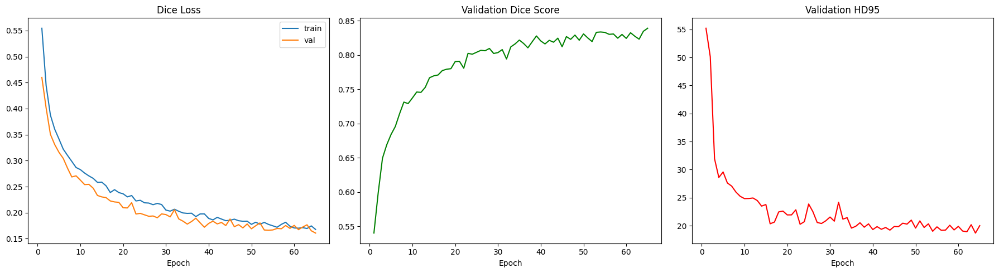

In [1]:
%matplotlib inline
# ════════════════════════════════════════════════════════════════
# PLOT TRAINING METRICS FROM SAVED CHECKPOINT (LAPTOP LOCAL)
# ════════════════════════════════════════════════════════════════
import torch
import matplotlib.pyplot as plt
from pathlib import Path

# Absolute path to your checkpoint
ckpt_path = Path(r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/HybridPlan/checkpoints_3d/3dbreastnet_best.pth")

if ckpt_path.exists():
    print(f"Loading checkpoint: {ckpt_path}")
    ckpt = torch.load(ckpt_path, map_location="cpu", weights_only=False)
    hist = ckpt["hist"]
    
    fig, ax = plt.subplots(1, 3, figsize=(18, 5))
    ax[0].plot(hist["epoch"], hist["train_loss"], label="train")
    ax[0].plot(hist["epoch"], hist["val_loss"], label="val")
    ax[0].set_title("Dice Loss"); ax[0].legend()
    
    ax[1].plot(hist["epoch"], hist["val_dice"], color="green")
    ax[1].set_title("Validation Dice Score")
    
    ax[2].plot(hist["epoch"], hist["val_hd"], color="red")
    ax[2].set_title("Validation HD95")
    
    for a in ax: a.set_xlabel("Epoch")
    plt.tight_layout()
    plt.show()
else:
    print(f"Checkpoint not found at {ckpt_path}.")


### Fine Tuning

Loading baseline model from: checkpoints_3d/3dbreastnet_best.pth
Model loaded! Starting Base Dice: 0.8392


FT E001 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E001 val:   0%|          | 0/16 [00:00<?, ?it/s]

E001 | loss=0.1022 | vl=0.1633 vd=0.8367 hd=19.15 | lr=0.000020 | 15.7s


FT E002 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E002 val:   0%|          | 0/16 [00:00<?, ?it/s]

E002 | loss=0.0999 | vl=0.1627 vd=0.8373 hd=18.72 | lr=0.000020 | 15.3s


FT E003 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E003 val:   0%|          | 0/16 [00:00<?, ?it/s]

E003 | loss=0.0965 | vl=0.1619 vd=0.8381 hd=18.63 | lr=0.000020 | 15.9s


FT E004 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E004 val:   0%|          | 0/16 [00:00<?, ?it/s]

E004 | loss=0.0984 | vl=0.1649 vd=0.8351 hd=19.11 | lr=0.000020 | 15.6s


FT E005 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E005 val:   0%|          | 0/16 [00:00<?, ?it/s]

E005 | loss=0.0999 | vl=0.1617 vd=0.8383 hd=18.83 | lr=0.000020 | 15.5s


FT E006 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E006 val:   0%|          | 0/16 [00:00<?, ?it/s]

E006 | loss=0.0952 | vl=0.1660 vd=0.8340 hd=18.50 | lr=0.000020 | 15.8s


FT E007 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E007 val:   0%|          | 0/16 [00:00<?, ?it/s]

E007 | loss=0.0955 | vl=0.1667 vd=0.8333 hd=18.72 | lr=0.000020 | 15.6s


FT E008 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E008 val:   0%|          | 0/16 [00:00<?, ?it/s]

E008 | loss=0.0956 | vl=0.1635 vd=0.8365 hd=18.40 | lr=0.000020 | 15.9s


FT E009 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E009 val:   0%|          | 0/16 [00:00<?, ?it/s]

E009 | loss=0.0939 | vl=0.1632 vd=0.8368 hd=18.47 | lr=0.000020 | 15.5s


FT E010 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E010 val:   0%|          | 0/16 [00:00<?, ?it/s]

E010 | loss=0.0962 | vl=0.1643 vd=0.8357 hd=18.41 | lr=0.000020 | 15.4s


FT E011 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E011 val:   0%|          | 0/16 [00:00<?, ?it/s]

E011 | loss=0.0944 | vl=0.1611 vd=0.8389 hd=18.78 | lr=0.000020 | 15.4s


FT E012 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E012 val:   0%|          | 0/16 [00:00<?, ?it/s]

E012 | loss=0.0939 | vl=0.1648 vd=0.8352 hd=19.00 | lr=0.000020 | 15.5s


FT E013 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E013 val:   0%|          | 0/16 [00:00<?, ?it/s]

E013 | loss=0.0955 | vl=0.1617 vd=0.8383 hd=18.74 | lr=0.000020 | 15.5s


FT E014 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E014 val:   0%|          | 0/16 [00:00<?, ?it/s]

E014 | loss=0.0943 | vl=0.1626 vd=0.8374 hd=18.78 | lr=0.000020 | 15.5s


FT E015 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E015 val:   0%|          | 0/16 [00:00<?, ?it/s]

E015 | loss=0.0943 | vl=0.1620 vd=0.8380 hd=18.85 | lr=0.000020 | 15.4s


FT E016 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E016 val:   0%|          | 0/16 [00:00<?, ?it/s]

E016 | loss=0.0941 | vl=0.1647 vd=0.8353 hd=18.18 | lr=0.000020 | 15.4s


FT E017 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E017 val:   0%|          | 0/16 [00:00<?, ?it/s]

E017 | loss=0.0917 | vl=0.1642 vd=0.8358 hd=18.82 | lr=0.000020 | 15.5s


FT E018 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E018 val:   0%|          | 0/16 [00:00<?, ?it/s]

E018 | loss=0.0949 | vl=0.1618 vd=0.8382 hd=18.57 | lr=0.000020 | 15.5s


FT E019 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E019 val:   0%|          | 0/16 [00:00<?, ?it/s]

E019 | loss=0.0931 | vl=0.1619 vd=0.8381 hd=18.59 | lr=0.000020 | 15.5s


FT E020 train:   0%|          | 0/53 [00:00<?, ?it/s]

FT E020 val:   0%|          | 0/16 [00:00<?, ?it/s]

E020 | loss=0.0948 | vl=0.1651 vd=0.8349 hd=18.12 | lr=0.000020 | 15.5s
Early stopping @ epoch 20
Plots saved. Best Dice=0.8392


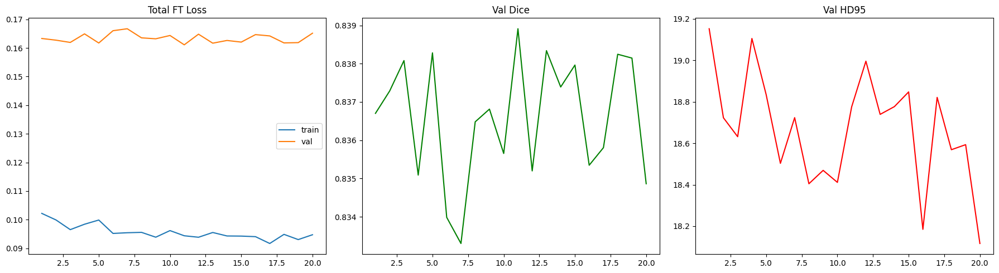

In [5]:
# ════════════════════════════════════════════════════════════════════════════
# 3DBREASTNET — ANATOMICAL VOXEL RECONSTRUCTION FINE-TUNING PIPELINE (GPU)
# ════════════════════════════════════════════════════════════════════════════

import os, sys, time, random, glob, math
import numpy as np, cv2, scipy.ndimage
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.auto import tqdm
import torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

# ── 1. CONFIGS ──────────────────────────────────────────────────────────────
CFG_FT = {
    "epochs":       60,                 
    "batch_size":   2,
    "lr":           2e-5,               
    "betas":        (0.9, 0.999),       # CRITICAL STABILITY FIX
    "n_per_view":   2,
    "seed":         42,
    "patience":     20,
    "ckpt_dir":     "checkpoints_3d_finetunedv2",
    "base_ckpt":    r"checkpoints_3d/3dbreastnet_best.pth", # Fine-tuning your original single run
    "otsu_dir":     r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient_otsu",
    "unet_dir":     r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient_unet",
}

# ── 2. MODEL DEFINITIONS ────────────────────────────────────────────────────
class DoubleConv2D(nn.Module):
    def __init__(self, inc, outc, drop=0.2):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(inc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True),
            nn.Dropout2d(drop) if drop > 0 else nn.Identity(),
            nn.Conv2d(outc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True))
    def forward(self, x): return self.block(x)

class DoubleConv3D(nn.Module):
    def __init__(self, inc, outc, drop=0.2):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv3d(inc, outc, 3, padding=1, bias=False),
            nn.BatchNorm3d(outc), nn.ReLU(True),
            nn.Dropout3d(drop) if drop > 0 else nn.Identity(),
            nn.Conv3d(outc, outc, 3, padding=1, bias=False),
            nn.BatchNorm3d(outc), nn.ReLU(True))
    def forward(self, x): return self.block(x)

def _init(m):
    if isinstance(m, (nn.Conv2d, nn.Conv3d, nn.ConvTranspose2d, nn.ConvTranspose3d)):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None: nn.init.constant_(m.bias, 0)
    elif isinstance(m, (nn.BatchNorm2d, nn.BatchNorm3d)):
        nn.init.constant_(m.weight, 1); nn.init.constant_(m.bias, 0)
    elif isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None: nn.init.constant_(m.bias, 0)

class Encoder2D(nn.Module):
    def __init__(self, drop=0.25):
        super().__init__()
        self.pool = nn.MaxPool2d(2)
        self.enc1 = DoubleConv2D(10, 32, 0)  # 10 Channels for Otsu+UNet
        self.enc2 = DoubleConv2D(32, 64, 0)
        self.enc3 = DoubleConv2D(64, 128, drop)
        self.enc4 = DoubleConv2D(128, 256, drop)
        self.enc5 = DoubleConv2D(256, 512, drop)
        self.enc6 = DoubleConv2D(512, 512, drop)
        self.fc = nn.Sequential(nn.Dropout(drop), nn.Linear(512 * 2 * 2, 1000))
        self.apply(_init)
    def forward(self, x):
        for enc in [self.enc1, self.enc2, self.enc3, self.enc4, self.enc5, self.enc6]:
            x = enc(x); x = self.pool(x)
        return self.fc(x.view(x.size(0), -1))

class Decoder3D(nn.Module):
    def __init__(self, drop=0.25):
        super().__init__()
        self.fc = nn.Linear(1000, 512 * 2 * 2 * 2)
        self.up1 = nn.ConvTranspose3d(512, 256, 2, stride=2); self.d1 = DoubleConv3D(256, 256, drop)
        self.up2 = nn.ConvTranspose3d(256, 128, 2, stride=2); self.d2 = DoubleConv3D(128, 128, drop)
        self.up3 = nn.ConvTranspose3d(128, 64, 2, stride=2);  self.d3 = DoubleConv3D(64, 64, drop)
        self.up4 = nn.ConvTranspose3d(64, 32, 2, stride=2);   self.d4 = DoubleConv3D(32, 32, 0)
        self.up5 = nn.ConvTranspose3d(32, 16, 2, stride=2);   self.d5 = DoubleConv3D(16, 16, 0)
        self.up6 = nn.ConvTranspose3d(16, 8, 2, stride=2);    self.d6 = DoubleConv3D(8, 8, 0)
        self.out = nn.Sequential(nn.Conv3d(8, 1, 1), nn.Sigmoid())
        self.apply(_init)
        nn.init.constant_(self.out[0].bias, -4.0)

    def forward(self, x):
        x = self.fc(x).view(x.size(0), 512, 2, 2, 2)
        x = self.d1(self.up1(x)); x = self.d2(self.up2(x))
        x = self.d3(self.up3(x)); x = self.d4(self.up4(x))
        x = self.d5(self.up5(x)); x = self.d6(self.up6(x))
        return self.out(x)


# ── 3. BLAZING FAST HYBRID DATALOADER ────────────────────────────────────────
def build_hybrid_patients(otsu_dir, unet_dir):
    otsu_p = set([f for f in os.listdir(otsu_dir) if f.startswith('Patient_')])
    unet_p = set([f for f in os.listdir(unet_dir) if f.startswith('Patient_')])
    valid_patients = sorted(list(otsu_p.intersection(unet_p)))
    patients = []
    for p in valid_patients:
        subs = [d for d in os.listdir(os.path.join(otsu_dir, p)) if os.path.isdir(os.path.join(otsu_dir, p, d))]
        if subs: patients.append((p, subs[0]))
    return patients

class HybridPatientDataset(Dataset):
    def __init__(self, patient_tuples, otsu_dir, unet_dir, img_sz=128):
        self.patients = patient_tuples
        self.otsu_dir = otsu_dir; self.unet_dir = unet_dir
        self.img_sz = img_sz
        self.views = ['Right Lateral', 'Right Oblique', 'Anterior', 'Left Oblique', 'Left Lateral']
    def __len__(self): return len(self.patients)
    def __getitem__(self, idx):
        pid, cat = self.patients[idx]
        otsu_full = os.path.join(self.otsu_dir, pid, cat)
        unet_full = os.path.join(self.unet_dir, pid, cat)
        
        otsu_tensors, unet_tensors = [], []
        for view in self.views:
            of = [f for f in glob.glob(os.path.join(otsu_full, "*.png")) if view in os.path.basename(f)]
            if of:
                m = cv2.imdecode(np.fromfile(of[0], dtype=np.uint8), cv2.IMREAD_GRAYSCALE)
                otsu_tensors.append(torch.from_numpy(cv2.resize(m, (self.img_sz, self.img_sz), interpolation=cv2.INTER_NEAREST)).float() / 255.0)
            else: otsu_tensors.append(torch.zeros((self.img_sz, self.img_sz), dtype=torch.float32))
                
            uf = [f for f in glob.glob(os.path.join(unet_full, "*.png")) if view in os.path.basename(f)]
            if uf:
                m = cv2.imdecode(np.fromfile(uf[0], dtype=np.uint8), cv2.IMREAD_GRAYSCALE)
                unet_tensors.append(torch.from_numpy(cv2.resize(m, (self.img_sz, self.img_sz), interpolation=cv2.INTER_NEAREST)).float() / 255.0)
            else: unet_tensors.append(torch.zeros((self.img_sz, self.img_sz), dtype=torch.float32))
        
        input_10ch = torch.cat([torch.stack(otsu_tensors, dim=0), torch.stack(unet_tensors, dim=0)], dim=0)
        return {"input_10ch": input_10ch, "target_5ch": torch.stack(unet_tensors, dim=0)}


# ── 4. METRIC & LOSS FUNCTIONS ───────────────────────────────────────────────
def hd95(p, t):
    if p.sum()==0 or t.sum()==0: return 128.0
    pe = p ^ scipy.ndimage.binary_erosion(p)
    te = t ^ scipy.ndimage.binary_erosion(t)
    dtp = scipy.ndimage.distance_transform_edt(~pe); dtt = scipy.ndimage.distance_transform_edt(~te)
    return max(np.percentile(dtt[pe], 95) if pe.sum()>0 else 128.0, np.percentile(dtp[te], 95) if te.sum()>0 else 128.0)

def silhouette_loss(pred, target):
    p = pred.float(); t = target.float()
    num = 2*(p*t).sum(); den = p.pow(2).sum() + t.pow(2).sum() + 1e-6
    dl = 1 - num/den
    bce = F.binary_cross_entropy(torch.clamp(p, 1e-7, 1.0-1e-7), t)
    return dl + 0.15 * bce

def total_variation_3d(vol):
    dx = torch.abs(vol[:, :, 1:, :, :] - vol[:, :, :-1, :, :]).mean()
    dy = torch.abs(vol[:, :, :, 1:, :] - vol[:, :, :, :-1, :]).mean()
    dz = torch.abs(vol[:, :, :, :, 1:] - vol[:, :, :, :, :-1]).mean()
    return dx + dy + dz

def inter_mammary_valley_loss(vol):
    W = vol.shape[-1]; mid = W // 2
    return vol[:, :, :, :, mid-4:mid+4].mean()

def sparsity_loss(vol):
    return torch.mean(torch.abs(vol))

def render_projection(volume, theta_deg):
    B, C, D, H, W = volume.shape; dev = volume.device
    if not isinstance(theta_deg, torch.Tensor): theta_deg = torch.full((B,), float(theta_deg), device=dev, dtype=torch.float32)
    theta_deg = theta_deg.float(); rad = theta_deg * math.pi / 180.0
    c, s = torch.cos(rad), torch.sin(rad); z, o = torch.zeros_like(rad), torch.ones_like(rad)
    mat = torch.stack([torch.stack([c, z, s, z], -1), torch.stack([z, o, z, z], -1), torch.stack([-s, z, c, z], -1)], -2)
    grid = F.affine_grid(mat, volume.shape, align_corners=False)
    Vr = F.grid_sample(volume, grid, mode='bilinear', padding_mode='zeros', align_corners=False)
    return 1.0 - torch.exp(-Vr.squeeze(1).sum(dim=1, keepdim=True))

def dice_loss(pred, target, eps=1e-6):
    p, t = pred.float(), target.float()
    num = 2 * (p * t).sum(); den = p.pow(2).sum() + t.pow(2).sum() + eps
    return 1 - num / den

VIEW_WINDOWS = [(-90., -67.5), (-67.5, -22.5), (-22.5, 22.5), (22.5, 67.5), (67.5, 90.)]


# ── 5. FINE-TUNING LOOP EXECUTION ────────────────────────────────────────────
def fine_tune_reconstructor(cfg):
    torch.manual_seed(cfg["seed"]); np.random.seed(cfg["seed"])
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    groups = build_hybrid_patients(cfg["otsu_dir"], cfg["unet_dir"])
    rng = random.Random(cfg["seed"])
    ben = [g for g in groups if "benign" in g[1].lower()]
    mal = [g for g in groups if "benign" not in g[1].lower()]
    rng.shuffle(ben); rng.shuffle(mal)
    s = 0.78
    trn = ben[:int(len(ben)*s)] + mal[:int(len(mal)*s)]
    val = ben[int(len(ben)*s):] + mal[int(len(mal)*s):]

    trn_dl = DataLoader(HybridPatientDataset(trn, cfg["otsu_dir"], cfg["unet_dir"]), batch_size=cfg["batch_size"], shuffle=True, drop_last=True)
    val_dl = DataLoader(HybridPatientDataset(val, cfg["otsu_dir"], cfg["unet_dir"]), batch_size=cfg["batch_size"], shuffle=False)

    enc = Encoder2D().to(device); dec = Decoder3D().to(device)
    
    best_dice = 0.0
    base_ckpt = Path(cfg["base_ckpt"])
    if base_ckpt.exists():
        print(f"Loading baseline model from: {base_ckpt}")
        checkpoint = torch.load(base_ckpt, map_location=device, weights_only=False)
        enc.load_state_dict(checkpoint["enc"])
        dec.load_state_dict(checkpoint["dec"])
        best_dice = checkpoint.get("best_dice", 0.8200)
        print(f"Model loaded! Starting Base Dice: {best_dice:.4f}")
    else:
        print(f"WARNING: Base checkpoint not found at {base_ckpt}")

    # PURE FP32 + AdamW FIX
    opt = torch.optim.AdamW(list(enc.parameters()) + list(dec.parameters()), lr=cfg["lr"], betas=cfg["betas"], weight_decay=1e-4)
    sched = torch.optim.lr_scheduler.ReduceLROnPlateau(opt, mode="max", factor=0.5, patience=10, min_lr=1e-6)
    
    Path(cfg["ckpt_dir"]).mkdir(parents=True, exist_ok=True)
    no_imp = 0
    hist = {"epoch":[], "train_loss":[], "val_loss":[], "val_dice":[], "val_hd":[]}
    val_angles = [-90., -45., 0., 45., 90.]

    for epoch in range(1, cfg["epochs"]+1):
        t0 = time.time()
        enc.train(); dec.train()
        ep_loss = 0.0
        
        for batch in tqdm(trn_dl, desc=f"FT E{epoch:03d} train", leave=False):
            inp10 = batch["input_10ch"].to(device); tgt5 = batch["target_5ch"].to(device)
            B = inp10.size(0)
            opt.zero_grad(set_to_none=True)
            
            vol = dec(enc(inp10)).float()
            proj_loss = torch.tensor(0.0, device=device)
            
            for i in range(5):
                lo, hi = VIEW_WINDOWS[i]
                for _ in range(cfg["n_per_view"]):
                    proj_loss += 0.5 * silhouette_loss(render_projection(vol, torch.rand(B, device=device)*(hi-lo)+lo), tgt5[:, i:i+1])
                proj_loss += 0.5 * silhouette_loss(render_projection(vol, torch.full((B,), val_angles[i], device=device)), tgt5[:, i:i+1])
            proj_loss /= (5 * (cfg["n_per_view"] + 1))
            
            total_loss = proj_loss + 0.10 * total_variation_3d(vol) + 0.08 * inter_mammary_valley_loss(vol) + 0.002 * sparsity_loss(vol)
            
            total_loss.backward()
            torch.nn.utils.clip_grad_norm_(list(enc.parameters()) + list(dec.parameters()), 1.0)
            opt.step()
            
            ep_loss += total_loss.item()
            
        ep_loss /= max(len(trn_dl), 1)

        enc.eval(); dec.eval()
        vl, vd, vh, cnt = 0., 0., 0., 0
        with torch.no_grad():
            for batch in tqdm(val_dl, desc=f"FT E{epoch:03d} val", leave=False):
                inp10 = batch["input_10ch"].to(device); tgt5 = batch["target_5ch"].to(device)
                B = inp10.size(0)
                vol = dec(enc(inp10)).float()
                
                for i in range(5):
                    proj = render_projection(vol, torch.full((B,), val_angles[i], device=device))
                    dl = dice_loss(proj, tgt5[:, i:i+1]) 
                    vl += dl.item(); vd += (1-dl).item()
                    pb, mb = (proj>0.5).cpu().numpy(), (tgt5[:, i:i+1]>0.5).cpu().numpy()
                    for b in range(B): vh += hd95(pb[b,0], mb[b,0]); cnt += 1
                    
        vl /= max(len(val_dl)*5, 1); vd /= max(len(val_dl)*5, 1); vh /= max(cnt, 1)
        hist["epoch"].append(epoch); hist["train_loss"].append(ep_loss)
        hist["val_loss"].append(vl); hist["val_dice"].append(vd); hist["val_hd"].append(vh)
        sched.step(vd)

        print(f"E{epoch:03d} | loss={ep_loss:.4f} | vl={vl:.4f} vd={vd:.4f} hd={vh:.2f} | lr={opt.param_groups[0]['lr']:.6f} | {time.time()-t0:.1f}s")

        ckpt = {"epoch": epoch, "enc": enc.state_dict(), "dec": dec.state_dict(), "best_dice": max(best_dice, vd)}
        torch.save(ckpt, Path(cfg["ckpt_dir"]) / "3dbreastnet_finetunedv2_last.pth")
        if vd > best_dice:
            best_dice = vd; no_imp = 0
            torch.save(ckpt, Path(cfg["ckpt_dir"]) / "3dbreastnet_finetunedv2_best.pth")
        else:
            no_imp += 1
            if no_imp >= cfg["patience"]: print(f"Early stopping @ epoch {epoch}"); break

    fig, ax = plt.subplots(1, 3, figsize=(18, 5))
    ax[0].plot(hist["epoch"], hist["train_loss"], label="train"); ax[0].plot(hist["epoch"], hist["val_loss"], label="val")
    ax[0].set_title("Total FT Loss"); ax[0].legend()
    ax[1].plot(hist["epoch"], hist["val_dice"], color="green"); ax[1].set_title("Val Dice")
    ax[2].plot(hist["epoch"], hist["val_hd"], color="red"); ax[2].set_title("Val HD95")
    plt.tight_layout(); plt.savefig(Path(cfg["ckpt_dir"]) / "fine_tuning_historyv2.png", dpi=150)
    print(f"Plots saved. Best Dice={best_dice:.4f}")

fine_tune_reconstructor(CFG_FT)


Running diagnostics on device: cuda

Loading fine-tuned model checkpoint from: /mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/HybridPlan/checkpoints_3d_finetunedv2/3dbreastnet_finetunedv2_last.pth
Training history not found in checkpoint file.


Evaluating Validation Split:   0%|          | 0/31 [00:00<?, ?it/s]


════════════════════════════════════════════════════════════════════════
           DETAILED RECONSTRUCTION METRICS BY ACQUISITION ANGLE
════════════════════════════════════════════════════════════════════════
View Name                      | Mean Dice Score      | Mean HD95 (pixels)  
----------------------------------------------------------------------------
Right Lateral (RL)             | 0.7313               | 19.89               
Right Oblique (RO)             | 0.8042               | 19.29               
Frontal (F)                    | 0.8605               | 10.54               
Left Oblique (LO)              | 0.7904               | 21.45               
Left Lateral (LL)              | 0.7498               | 19.40               
════════════════════════════════════════════════════════════════════════

 Generating side-by-side validation visual audits...


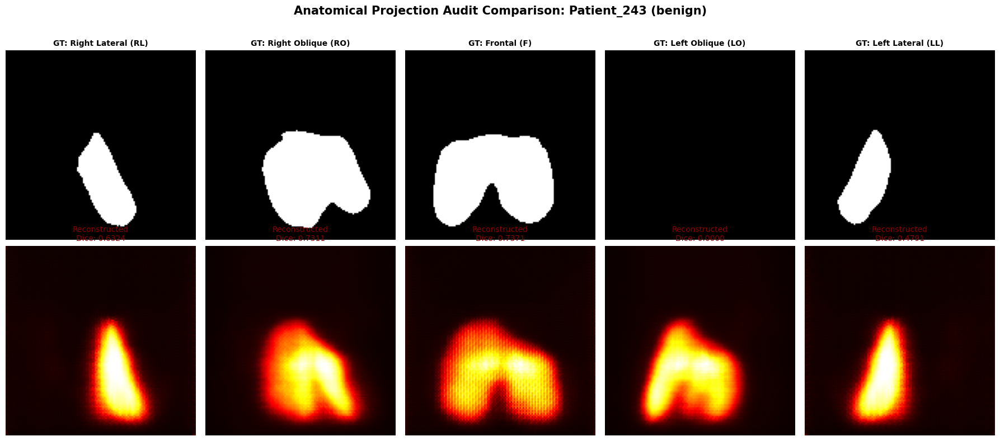

In [10]:
# ════════════════════════════════════════════════════════════════════════════
# 3DBREASTNET — POST-FINE-TUNING EVALUATION & VISUAL DASHBOARD (DEFAULT GPU)
# ════════════════════════════════════════════════════════════════════════════

import os, sys, time, random, glob, math
import numpy as np, cv2, scipy.ndimage
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.auto import tqdm
import torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

# 1. Config for Evaluation
EVAL_CFG = {
    "ckpt_dir":     "checkpoints_3d_finetunedv2",
    # (Change this path if you want to evaluate `_best` instead of `_last`)
    "best_ckpt":    r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/HybridPlan/checkpoints_3d_finetunedv2/3dbreastnet_finetunedv2_last.pth",
    "otsu_dir":     r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient_otsu",
    "unet_dir":     r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient_unet",
    "seed":         42,
}

# ── BLAZING FAST HYBRID DATALOADER ────────────────────────────────────────
def build_hybrid_patients(otsu_dir, unet_dir):
    otsu_p = set([f for f in os.listdir(otsu_dir) if f.startswith('Patient_')])
    unet_p = set([f for f in os.listdir(unet_dir) if f.startswith('Patient_')])
    valid_patients = sorted(list(otsu_p.intersection(unet_p)))
    patients = []
    for p in valid_patients:
        subs = [d for d in os.listdir(os.path.join(otsu_dir, p)) if os.path.isdir(os.path.join(otsu_dir, p, d))]
        if subs: patients.append((p, subs[0]))
    return patients

class HybridPatientDataset(Dataset):
    def __init__(self, patient_tuples, otsu_dir, unet_dir, img_sz=128):
        self.patients = patient_tuples
        self.otsu_dir = otsu_dir; self.unet_dir = unet_dir
        self.img_sz = img_sz
        self.views = ['Right Lateral', 'Right Oblique', 'Anterior', 'Left Oblique', 'Left Lateral']
    def __len__(self): return len(self.patients)
    def __getitem__(self, idx):
        pid, cat = self.patients[idx]
        otsu_full = os.path.join(self.otsu_dir, pid, cat)
        unet_full = os.path.join(self.unet_dir, pid, cat)
        
        otsu_tensors, unet_tensors = [], []
        for view in self.views:
            of = [f for f in glob.glob(os.path.join(otsu_full, "*.png")) if view in os.path.basename(f)]
            if of:
                m = cv2.imdecode(np.fromfile(of[0], dtype=np.uint8), cv2.IMREAD_GRAYSCALE)
                otsu_tensors.append(torch.from_numpy(cv2.resize(m, (self.img_sz, self.img_sz), interpolation=cv2.INTER_NEAREST)).float() / 255.0)
            else: otsu_tensors.append(torch.zeros((self.img_sz, self.img_sz), dtype=torch.float32))
                
            uf = [f for f in glob.glob(os.path.join(unet_full, "*.png")) if view in os.path.basename(f)]
            if uf:
                m = cv2.imdecode(np.fromfile(uf[0], dtype=np.uint8), cv2.IMREAD_GRAYSCALE)
                unet_tensors.append(torch.from_numpy(cv2.resize(m, (self.img_sz, self.img_sz), interpolation=cv2.INTER_NEAREST)).float() / 255.0)
            else: unet_tensors.append(torch.zeros((self.img_sz, self.img_sz), dtype=torch.float32))
        
        input_10ch = torch.cat([torch.stack(otsu_tensors, dim=0), torch.stack(unet_tensors, dim=0)], dim=0)
        return {
            "input_10ch": input_10ch, 
            "target_5ch": torch.stack(unet_tensors, dim=0),
            "patient_id": pid,
            "label": cat
        }

# ── MODEL UTILS ────────────────────────────────────────────────────────────
def hd95(p, t):
    if p.sum()==0 or t.sum()==0: return 128.0
    pe = p ^ scipy.ndimage.binary_erosion(p)
    te = t ^ scipy.ndimage.binary_erosion(t)
    dtp = scipy.ndimage.distance_transform_edt(~pe); dtt = scipy.ndimage.distance_transform_edt(~te)
    return max(np.percentile(dtt[pe], 95) if pe.sum()>0 else 128.0, np.percentile(dtp[te], 95) if te.sum()>0 else 128.0)

def dice_loss(pred, target, eps=1e-6):
    p, t = pred.float(), target.float()
    num = 2 * (p * t).sum(); den = p.pow(2).sum() + t.pow(2).sum() + eps
    return 1 - num / den

def render_projection(volume, theta_deg):
    B, C, D, H, W = volume.shape; dev = volume.device
    if not isinstance(theta_deg, torch.Tensor): theta_deg = torch.full((B,), float(theta_deg), device=dev, dtype=torch.float32)
    theta_deg = theta_deg.float(); rad = theta_deg * math.pi / 180.0
    c, s = torch.cos(rad), torch.sin(rad); z, o = torch.zeros_like(rad), torch.ones_like(rad)
    mat = torch.stack([torch.stack([c, z, s, z], -1), torch.stack([z, o, z, z], -1), torch.stack([-s, z, c, z], -1)], -2)
    grid = F.affine_grid(mat, volume.shape, align_corners=False)
    Vr = F.grid_sample(volume, grid, mode='bilinear', padding_mode='zeros', align_corners=False)
    return 1.0 - torch.exp(-Vr.squeeze(1).sum(dim=1, keepdim=True))

def run_visual_diagnostics(cfg):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Running diagnostics on device: {device}\n")

    groups = build_hybrid_patients(cfg["otsu_dir"], cfg["unet_dir"])
    rng = random.Random(cfg["seed"])
    ben = [g for g in groups if "benign" in g[1].lower()]
    mal = [g for g in groups if "benign" not in g[1].lower()]
    rng.shuffle(ben); rng.shuffle(mal)
    s = 0.78
    val_groups = ben[int(len(ben)*s):] + mal[int(len(mal)*s):]
    
    val_dl = DataLoader(HybridPatientDataset(val_groups, cfg["otsu_dir"], cfg["unet_dir"]), batch_size=1, shuffle=False)

    # Note: Assumes Encoder2D and Decoder3D are already defined in a previous cell!
    enc = Encoder2D().to(device)
    dec = Decoder3D().to(device)
    
    ckpt_path = Path(cfg["best_ckpt"])
    if not ckpt_path.exists():
        raise FileNotFoundError(f"Fine-tuned checkpoint not found at {ckpt_path}!")
        
    print(f"Loading fine-tuned model checkpoint from: {ckpt_path}")
    ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
    enc.load_state_dict(ckpt["enc"])
    dec.load_state_dict(ckpt["dec"])
    enc.eval(); dec.eval()

    # PART 1
    if "hist" in ckpt:
        hist = ckpt["hist"]
        epochs = hist["epoch"]
        
        plt.style.use('seaborn-v0_8-whitegrid' if 'seaborn-v0_8-whitegrid' in plt.style.available else 'default')
        fig, ax = plt.subplots(1, 3, figsize=(18, 5))
        
        ax[0].plot(epochs, hist["train_loss"], label="Train Loss", color="#1f77b4", linewidth=2)
        ax[0].plot(epochs, hist["val_loss"], label="Val Loss", color="#ff7f0e", linewidth=2)
        ax[0].set_title("Training & Validation Loss Progression", fontsize=12, fontweight='bold')
        ax[0].set_xlabel("Epochs", fontsize=10)
        ax[0].set_ylabel("Loss", fontsize=10)
        ax[0].legend(frameon=True)
        
        ax[1].plot(epochs, hist["val_dice"], color="#2ca02c", linewidth=2.5, label="Validation Dice")
        ax[1].axhline(y=max(hist["val_dice"]), color="r", linestyle="--", alpha=0.7, label=f"Best Dice: {max(hist['val_dice']):.4f}")
        ax[1].set_title("Validation Dice Score Over Epochs", fontsize=12, fontweight='bold')
        ax[1].set_xlabel("Epochs", fontsize=10)
        ax[1].set_ylabel("Dice Coefficient", fontsize=10)
        ax[1].legend(frameon=True)
        
        ax[2].plot(epochs, hist["val_hd"], color="#d62728", linewidth=2, label="HD95 Distance")
        ax[2].set_title("Validation Hausdorff Distance (HD95) Trend", fontsize=12, fontweight='bold')
        ax[2].set_xlabel("Epochs", fontsize=10)
        ax[2].set_ylabel("HD95 (pixels)", fontsize=10)
        ax[2].legend(frameon=True)
        
        plt.tight_layout()
        plt.show()
    else:
        print("Training history not found in checkpoint file.")

    # PART 2
    val_angles = [-90., -45., 0., 45., 90.]
    view_names = ["Right Lateral (RL)", "Right Oblique (RO)", "Frontal (F)", "Left Oblique (LO)", "Left Lateral (LL)"]
    
    angle_dices = {ang: [] for ang in val_angles}
    angle_hds = {ang: [] for ang in val_angles}
    
    with torch.no_grad():
        for batch in tqdm(val_dl, desc="Evaluating Validation Split"):
            inp10 = batch["input_10ch"].to(device)
            tgt5 = batch["target_5ch"].to(device)
            B = inp10.size(0)
            
            vol = dec(enc(inp10)).float()
            
            for i, ang in enumerate(val_angles):
                th = torch.full((B,), ang, device=device)
                proj = render_projection(vol, th)
                
                dl = dice_loss(proj, tgt5[:, i:i+1])
                angle_dices[ang].append(1.0 - dl.item())
                
                pb = (proj > 0.5).cpu().numpy()
                mb = (tgt5[:, i:i+1] > 0.5).cpu().numpy()
                for b in range(B):
                    angle_hds[ang].append(hd95(pb[b,0], mb[b,0]))

    print("\n════════════════════════════════════════════════════════════════════════")
    print("           DETAILED RECONSTRUCTION METRICS BY ACQUISITION ANGLE")
    print("════════════════════════════════════════════════════════════════════════")
    print(f"{'View Name':<30} | {'Mean Dice Score':<20} | {'Mean HD95 (pixels)':<20}")
    print("-" * 76)
    for i, ang in enumerate(val_angles):
        print(f"{view_names[i]:<30} | {np.mean(angle_dices[ang]):<20.4f} | {np.mean(angle_hds[ang]):<20.2f}")
    print("════════════════════════════════════════════════════════════════════════\n")

    # PART 3
    print(" Generating side-by-side validation visual audits...")
    sample_batch = next(iter(val_dl))
    inp10_sample = sample_batch["input_10ch"].to(device)
    tgt5_sample = sample_batch["target_5ch"].to(device)
    pid_sample = sample_batch["patient_id"][0]
    label_sample = sample_batch["label"][0]
    
    with torch.no_grad(): vol_sample = dec(enc(inp10_sample)).float()
        
    fig, axes = plt.subplots(2, 5, figsize=(18, 8))
    fig.suptitle(f"Anatomical Projection Audit Comparison: {pid_sample} ({label_sample})", fontsize=15, fontweight='bold', y=0.98)
    
    for i, ang in enumerate(val_angles):
        gt_mask = tgt5_sample[0, i].cpu().numpy()
        axes[0, i].imshow(gt_mask, cmap='gray')
        axes[0, i].set_title(f"GT: {view_names[i]}", fontsize=10, fontweight='bold')
        axes[0, i].axis('off')
        
        th = torch.full((1,), ang, device=device)
        proj_sample = render_projection(vol_sample, th).squeeze().cpu().numpy()
            
        axes[1, i].imshow(proj_sample, cmap='hot')
        
        intersect = np.sum((proj_sample > 0.5) * (gt_mask > 0.5))
        denom = np.sum(proj_sample > 0.5) + np.sum(gt_mask > 0.5)
        ind_dice = (2.0 * intersect + 1e-6) / (denom + 1e-6)
        
        axes[1, i].set_title(f"Reconstructed\nDice: {ind_dice:.4f}", fontsize=10, color='darkgreen' if ind_dice > 0.8 else 'darkred')
        axes[1, i].axis('off')
        
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()

# Run the diagnostics cell on default GPU
run_visual_diagnostics(EVAL_CFG)

## Post-Training 3D Visualization (Local Laptop)
Run this cell to perform inference using explicit local Windows paths.

In [33]:
# ════════════════════════════════════════════════════════════════
# 3D VISUALIZATION OF RANDOM PATIENTS (LAPTOP LOCAL) - UPRIGHT
# ════════════════════════════════════════════════════════════════
import os, random, glob
import numpy as np, cv2
from IPython.display import display, Image
import torch
from pathlib import Path
from skimage.measure import marching_cubes
from scipy.ndimage import gaussian_filter
import plotly.graph_objects as go
from torch.utils.data import Dataset

# ── 1. BLAZING FAST HYBRID DATALOADER ────────────────────────────────────────
def build_hybrid_patients(otsu_dir, unet_dir):
    otsu_p = set([f for f in os.listdir(otsu_dir) if f.startswith('Patient_')])
    unet_p = set([f for f in os.listdir(unet_dir) if f.startswith('Patient_')])
    valid_patients = sorted(list(otsu_p.intersection(unet_p)))
    patients = []
    for p in valid_patients:
        subs = [d for d in os.listdir(os.path.join(otsu_dir, p)) if os.path.isdir(os.path.join(otsu_dir, p, d))]
        if subs: patients.append((p, subs[0]))
    return patients

class HybridPatientDataset(Dataset):
    def __init__(self, patient_tuples, otsu_dir, unet_dir, img_sz=128):
        self.patients = patient_tuples
        self.otsu_dir = otsu_dir; self.unet_dir = unet_dir
        self.img_sz = img_sz
        self.views = ['Right Lateral', 'Right Oblique', 'Anterior', 'Left Oblique', 'Left Lateral']
    def __len__(self): return len(self.patients)
    def __getitem__(self, idx):
        pid, cat = self.patients[idx]
        otsu_full = os.path.join(self.otsu_dir, pid, cat)
        unet_full = os.path.join(self.unet_dir, pid, cat)
        
        otsu_tensors, unet_tensors = [], []
        for view in self.views:
            of = [f for f in glob.glob(os.path.join(otsu_full, "*.png")) if view in os.path.basename(f)]
            if of:
                m = cv2.imdecode(np.fromfile(of[0], dtype=np.uint8), cv2.IMREAD_GRAYSCALE)
                otsu_tensors.append(torch.from_numpy(cv2.resize(m, (self.img_sz, self.img_sz), interpolation=cv2.INTER_NEAREST)).float() / 255.0)
            else: otsu_tensors.append(torch.zeros((self.img_sz, self.img_sz), dtype=torch.float32))
                
            uf = [f for f in glob.glob(os.path.join(unet_full, "*.png")) if view in os.path.basename(f)]
            if uf:
                m = cv2.imdecode(np.fromfile(uf[0], dtype=np.uint8), cv2.IMREAD_GRAYSCALE)
                unet_tensors.append(torch.from_numpy(cv2.resize(m, (self.img_sz, self.img_sz), interpolation=cv2.INTER_NEAREST)).float() / 255.0)
            else: unet_tensors.append(torch.zeros((self.img_sz, self.img_sz), dtype=torch.float32))
        
        input_10ch = torch.cat([torch.stack(otsu_tensors, dim=0), torch.stack(unet_tensors, dim=0)], dim=0)
        return {"input_10ch": input_10ch, "patient_id": pid, "label": cat}

# ── 2. VISUALIZATION ENGINE ────────────────────────────────────────────────
def visualize_random_patients_local(n=5):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    
    # Adjust these paths for your laptop!
    otsu_dir = r"../../data/organized_by_patient_otsu"
    unet_dir = r"../../data/organized_by_patient_unet"
    
    # Let's visualize your brand new fine-tuned model
    ckpt_path = Path(r"../../UNET_Segmentation/HybridPlan/checkpoints_3d_finetunedv2/3dbreastnet_finetunedv2_last.pth")
    
    if not ckpt_path.exists():
        print(f"Error: No trained model found at {ckpt_path}. Make sure you copied it from the server!")
        return
        
    print("Loading 10-Channel Bottleneck Checkpoint...")
    
    # Note: Assumes Encoder2D and Decoder3D are already defined in a previous cell!
    ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
    enc = Encoder2D().to(device)
    dec = Decoder3D().to(device)
    enc.load_state_dict(ckpt["enc"])
    dec.load_state_dict(ckpt["dec"])
    enc.eval(); dec.eval()
    
    print(f"Loading patient list from {otsu_dir}...")
    groups = build_hybrid_patients(otsu_dir, unet_dir)
    if len(groups) == 0: 
        print("No patients found. Check dataset path.")
        return
    
    selected = random.sample(groups, min(n, len(groups)))
    dataset = HybridPatientDataset(selected, otsu_dir, unet_dir)
    
    print(f"Generating 3D models for {len(selected)} patients...")
    
    for i in range(len(dataset)):
        item = dataset[i]
        pid, label = item["patient_id"], item["label"]
        inp10 = item["input_10ch"].unsqueeze(0).to(device)
        
        # PURE FP32 Inference
        with torch.no_grad():
            vol = dec(enc(inp10)).float()
            
        vol_np = vol[0, 0].cpu().numpy()
        vol_np = gaussian_filter(vol_np, sigma=2.0)  # Smooth for better mesh extraction
        
        try:
            # 0.5 threshold perfectly matches the Sigmoid activation bounds
            verts, faces, normals, values = marching_cubes(vol_np, level=0.01)
            
            fig = go.Figure(data=[
                go.Mesh3d(
                    # SWAPPED AXES to make the patient stand upright!
                    x=verts[:, 2],     # Width mapped to X (left/right)
                    y=verts[:, 0],     # Depth mapped to Y (front/back)
                    z=-verts[:, 1],    # Height mapped to Z (inverted so head points up)
                    
                    i=faces[:, 0], j=faces[:, 1], k=faces[:, 2],
                    colorscale='Hot',
                    intensity=-verts[:, 1],  # Apply heat gradient vertically
                    showscale=False
                )
            ])
            
            # Lock the camera ratio so it doesn't squish the breasts
            fig.update_layout(
                title=f"Patient: {pid} | Label: {label} (Fine-Tuned 3D Reconstruction)",
                scene=dict(
                    xaxis_title='Width (X)', 
                    yaxis_title='Depth (Y)', 
                    zaxis_title='Height (Z)',
                    aspectmode='data',
                    camera=dict(
                        up=dict(x=0, y=0, z=1),         # Ensure Z is up
                        eye=dict(x=0, y=1.5, z=0.2)     # <--- MOVED TO POSITIVE Y (Looking from the front!)
                    )
                ),
                margin=dict(l=0, r=0, b=0, t=40)
            )

            fig.show()
        except ValueError:
            print(f"Could not generate 3D mesh for {pid} (volume might be empty).")

# Run it!
visualize_random_patients_local(n=5)


Using device: cuda
Loading 10-Channel Bottleneck Checkpoint...


Loading patient list from ../../data/organized_by_patient_otsu...
Generating 3D models for 5 patients...


### Thermal Overlay

In [ ]:
# ════════════════════════════════════════════════════════════════════════════
# 3D THERMAL OVERLAY (LAMBERTIAN WEIGHTED FUSION FOR IPBHE)
# ════════════════════════════════════════════════════════════════════════════

import random
import math
import numpy as np
import cv2
import tifffile
import torch
import torch.nn as nn
from torch.utils.data import Dataset
from pathlib import Path
from dataclasses import dataclass
from typing import Dict
from skimage.measure import marching_cubes
from scipy.ndimage import gaussian_filter, map_coordinates, binary_dilation
import plotly.graph_objects as go

from scipy.ndimage import map_coordinates, distance_transform_edt

# ── 1. MODEL ARCHITECTURES (EMBEDDED FOR STANDALONE EXECUTION) ───────────────
class DoubleConv2D(nn.Module):
    def __init__(self, inc, outc, drop=0.2):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(inc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True),
            nn.Dropout2d(drop) if drop > 0 else nn.Identity(),
            nn.Conv2d(outc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True))
    def forward(self, x): return self.block(x)

class DoubleConv3D(nn.Module):
    def __init__(self, inc, outc, drop=0.2):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv3d(inc, outc, 3, padding=1, bias=False),
            nn.BatchNorm3d(outc), nn.ReLU(True),
            nn.Dropout3d(drop) if drop > 0 else nn.Identity(),
            nn.Conv3d(outc, outc, 3, padding=1, bias=False),
            nn.BatchNorm3d(outc), nn.ReLU(True))
    def forward(self, x): return self.block(x)

def _init(m):
    if isinstance(m, (nn.Conv2d, nn.Conv3d, nn.ConvTranspose2d, nn.ConvTranspose3d)):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None: nn.init.constant_(m.bias, 0)
    elif isinstance(m, (nn.BatchNorm2d, nn.BatchNorm3d)):
        nn.init.constant_(m.weight, 1); nn.init.constant_(m.bias, 0)
    elif isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None: nn.init.constant_(m.bias, 0)

class DoubleConv(nn.Module):
    def __init__(self, inc, outc, drop=0.0):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(inc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True),
            nn.Conv2d(outc, outc, 3, padding=1, bias=False),
            nn.BatchNorm2d(outc), nn.ReLU(True),
            nn.Dropout2d(drop) if drop > 0 else nn.Identity())
    def forward(self, x): return self.block(x)

class UNet(nn.Module):
    def __init__(self, in_c=1, out_c=1, b=64, drop=0.2):
        super().__init__()
        self.pool = nn.MaxPool2d(2)
        self.enc1 = DoubleConv(in_c, b, 0.0)
        self.enc2 = DoubleConv(b, b*2, 0.0)
        self.enc3 = DoubleConv(b*2, b*4, 0.1)
        self.enc4 = DoubleConv(b*4, b*8, 0.1)
        self.bottleneck = DoubleConv(b*8, b*16, drop)
        self.up4 = nn.ConvTranspose2d(b*16, b*8, 2, stride=2)
        self.dec4 = DoubleConv(b*16, b*8, 0.1)
        self.up3 = nn.ConvTranspose2d(b*8, b*4, 2, stride=2)
        self.dec3 = DoubleConv(b*8, b*4, 0.1)
        self.up2 = nn.ConvTranspose2d(b*4, b*2, 2, stride=2)
        self.dec2 = DoubleConv(b*4, b*2, 0.0)
        self.up1 = nn.ConvTranspose2d(b*2, b, 2, stride=2)
        self.dec1 = DoubleConv(b*2, b, 0.0)
        self.out = nn.Conv2d(b, out_c, 1)
    def forward(self, x):
        e1=self.enc1(x); e2=self.enc2(self.pool(e1))
        e3=self.enc3(self.pool(e2)); e4=self.enc4(self.pool(e3))
        b=self.bottleneck(self.pool(e4))
        d4=self.dec4(torch.cat([self.up4(b),e4],1))
        d3=self.dec3(torch.cat([self.up3(d4),e3],1))
        d2=self.dec2(torch.cat([self.up2(d3),e2],1))
        d1=self.dec1(torch.cat([self.up1(d2),e1],1))
        return self.out(d1)

class Encoder2D(nn.Module):
    def __init__(self, drop=0.25):
        super().__init__()
        self.pool = nn.MaxPool2d(2)
        self.enc1 = DoubleConv2D(10, 32, 0)
        self.enc2 = DoubleConv2D(32, 64, 0)
        self.enc3 = DoubleConv2D(64, 128, drop)
        self.enc4 = DoubleConv2D(128, 256, drop)
        self.enc5 = DoubleConv2D(256, 512, drop)
        self.enc6 = DoubleConv2D(512, 512, drop)
        self.fc = nn.Sequential(nn.Dropout(drop), nn.Linear(512*2*2, 1000))
        self.apply(_init)
    def forward(self, x):
        for enc in [self.enc1, self.enc2, self.enc3, self.enc4, self.enc5, self.enc6]:
            x = enc(x); x = self.pool(x)
        return self.fc(x.view(x.size(0), -1))

class Decoder3D(nn.Module):
    def __init__(self, drop=0.25):
        super().__init__()
        self.fc = nn.Linear(1000, 512*2*2*2)
        self.up1=nn.ConvTranspose3d(512,256,2,stride=2); self.d1=DoubleConv3D(256,256,drop)
        self.up2=nn.ConvTranspose3d(256,128,2,stride=2); self.d2=DoubleConv3D(128,128,drop)
        self.up3=nn.ConvTranspose3d(128,64,2,stride=2);  self.d3=DoubleConv3D(64,64,drop)
        self.up4=nn.ConvTranspose3d(64,32,2,stride=2);   self.d4=DoubleConv3D(32,32,0)
        self.up5=nn.ConvTranspose3d(32,16,2,stride=2);   self.d5=DoubleConv3D(16,16,0)
        self.up6=nn.ConvTranspose3d(16,8,2,stride=2);    self.d6=DoubleConv3D(8,8,0)
        self.out = nn.Sequential(nn.Conv3d(8,1,1), nn.Sigmoid())
        self.apply(_init)
        nn.init.constant_(self.out[0].bias, -4.0)

    def _s4(self, x): return self.d4(self.up4(x))
    def _s5(self, x): return self.d5(self.up5(x))
    def _s6(self, x): return self.d6(self.up6(x))

    def forward(self, x):
        x = self.fc(x).view(x.size(0), 512, 2, 2, 2)
        x = self.d1(self.up1(x))
        x = self.d2(self.up2(x))
        x = self.d3(self.up3(x))
        if x.requires_grad:
            x = torch.utils.checkpoint.checkpoint(self._s4, x, use_reentrant=False)
            x = torch.utils.checkpoint.checkpoint(self._s5, x, use_reentrant=False)
            x = torch.utils.checkpoint.checkpoint(self._s6, x, use_reentrant=False)
        else:
            x = self._s4(x); x = self._s5(x); x = self._s6(x)
        return self.out(x)

# ── 2. DATA UTILITIES ────────────────────────────────────────────────────────
@dataclass
class PatientGroup:
    patient_id: str
    label: str
    views: Dict[str, Path]

def get_view_key(filename):
    n = filename.lower()
    if "right later" in n: return "RL"
    if "right obli"  in n: return "RO"
    if "frontal" in n or "anterior" in n: return "F"
    if "left obliq"  in n: return "LO"
    if "left later"  in n: return "LL"
    return None

def build_patient_groups(tiff_base):
    tb = Path(tiff_base)
    pd_ = {}
    for tp in tb.rglob("*.tiff"):
        parts = tp.relative_to(tb).parts
        if len(parts) < 3: continue
        pid, lab, fn = parts[0], parts[1], parts[-1]
        vk = get_view_key(fn)
        if not vk: continue
        key = (pid, lab)
        if key not in pd_: pd_[key] = {"views": {}}
        pd_[key]["views"][vk] = tp
    groups = [PatientGroup(pid, lab, d["views"]) for (pid, lab), d in pd_.items() if len(d["views"]) == 5]
    groups.sort(key=lambda g: g.patient_id)
    return groups

class PatientDataset(Dataset):
    def __init__(self, groups, unet, device):
        self.groups, self.unet, self.device = groups, unet, device
        self.views = ["RL","RO","F","LO","LL"]
        
    def __len__(self): return len(self.groups)
    
    def __getitem__(self, idx):
        g = self.groups[idx]; thermals_128, masks_128 = [], []
        for v in self.views:
            raw = tifffile.imread(str(g.views[v])).astype(np.float32)
            raw_256 = cv2.resize(raw, (256, 256))
            
            # Normalize to [0, 1] to fix auto-exposure differences between the 5 views!
            mn, mx = raw_256.min(), raw_256.max()
            norm = (raw_256 - mn) / (mx - mn + 1e-8)
            
            with torch.no_grad():
                inp = torch.tensor(norm).unsqueeze(0).unsqueeze(0).to(self.device)
                m = (torch.sigmoid(self.unet(inp)).squeeze().cpu().numpy() > 0.5).astype(np.float32)
            
            masks_128.append(cv2.resize(m, (128, 128), interpolation=cv2.INTER_NEAREST))
            
            # We must use the normalized image to ensure perfect camera blending!
            norm_128 = cv2.resize(norm, (128, 128), interpolation=cv2.INTER_LINEAR)
            thermals_128.append(norm_128)
            
        return {
            "masks_5ch": torch.tensor(np.stack(masks_128), dtype=torch.float32),
            "thermals_5ch": torch.tensor(np.stack(thermals_128), dtype=torch.float32),
            "patient_id": g.patient_id, "label": g.label,
        }

# ── 3. LAMBERTIAN WEIGHTED THERMAL FUSION FOR IPBHE ──────────────────────────
def compute_thermal_overlay(verts, normals, thermals_5ch, masks_5ch):
    intensities = np.zeros(len(verts))
    weight_sum = np.zeros(len(verts))
    
    w_in = verts[:, 2] - 63.5
    d_in = verts[:, 0] - 63.5
    h_in = verts[:, 1]
    
    outward_normals = -normals
    view_angles = [-90, -45, 0, 45, 90]
    
    for i, angle in enumerate(view_angles):
        rad = np.deg2rad(angle)
        c, s = np.cos(rad), np.sin(rad)
        
        cam_vec_w = -s
        cam_vec_d = -c
        
        # Exponential Weighting automatically isolates the best camera
        dot_prod = outward_normals[:, 2] * cam_vec_w + outward_normals[:, 0] * cam_vec_d
        weights = np.maximum(dot_prod + 0.3, 0.0) ** 12
        
        valid_idx = np.where(weights > 0)[0]
        if len(valid_idx) == 0: continue
        
        x_img = c * w_in[valid_idx] - s * d_in[valid_idx]
        x_coords = x_img + 63.5
        y_coords = h_in[valid_idx]
        
        thermal_img = thermals_5ch[0, i].cpu().numpy()
        
        # Smoothly sample the raw image (it naturally captures the patient's stomach/skin)
        sampled_thermals = map_coordinates(thermal_img, [y_coords, x_coords], order=1, mode='nearest')
        
        intensities[valid_idx] += sampled_thermals * weights[valid_idx]
        weight_sum[valid_idx] += weights[valid_idx]
        
    untextured = weight_sum == 0
    weight_sum[untextured] = 1.0  
    final_intensities = intensities / weight_sum
    
    # Frontal Fallback (In case the 3D reconstructor creates broken/inverted normals)
    if np.any(untextured):
        x_base = w_in[untextured] + 63.5
        y_base = h_in[untextured]
        thermal_base = thermals_5ch[0, 2].cpu().numpy() # Index 2 is Frontal
        base_thermals = map_coordinates(thermal_base, [y_base, x_base], order=1, mode='nearest')
        final_intensities[untextured] = base_thermals
        
    # NOTE: Chest wall clipping has been entirely removed! 
    # The network will now organically texture the deep chest wall without flat clipping errors.
    
    return final_intensities

# ── 4. VISUALIZATION EXECUTION ───────────────────────────────────────────────
def visualize_thermal_patients_local(n=3):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    
    unet_ckpt = r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/breast_segmentation_unet_best_gpu.pth"
    tiff_base = r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient"
    ckpt_path = Path(r"checkpoints_3d_finetuned/3dbreastnet_finetuned_best.pth")
    
    print("Loading models...")
    unet = UNet().to(device)
    unet.load_state_dict(torch.load(unet_ckpt, map_location=device, weights_only=False))
    unet.eval()
    
    ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
    enc = Encoder2D().to(device)
    dec = Decoder3D().to(device)
    enc.load_state_dict(ckpt["enc"])
    dec.load_state_dict(ckpt["dec"])
    enc.eval(); dec.eval()
    
    groups = build_patient_groups(tiff_base)
    selected = random.sample(groups, min(n, len(groups)))
    dataset = PatientDataset(selected, unet, device)
    
    for i in range(len(dataset)):
        item = dataset[i]
        pid, label = item["patient_id"], item["label"]
        m5 = item["masks_5ch"].unsqueeze(0).to(device)
        t5 = item["thermals_5ch"].unsqueeze(0).to(device)
        
        with torch.no_grad(), torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
            vol = dec(enc(m5))
            
        vol_np = vol.float()[0, 0].cpu().numpy()
        vol_np = gaussian_filter(vol_np, sigma=2.0)
        
        try:
            verts, faces, normals, values = marching_cubes(vol_np, level=0.01)
            
            thermal_paint = compute_thermal_overlay(verts, normals, t5, m5)
            
            fig = go.Figure(data=[
                go.Mesh3d(
                    x=verts[:, 2], y=verts[:, 0], z=-verts[:, 1], 
                    i=faces[:, 0], j=faces[:, 1], k=faces[:, 2],
                    colorscale='Jet',          
                    intensity=thermal_paint,   
                    showscale=True,
                    colorbar_title="Thermal<br>Intensity"
                )
            ])
            
            fig.update_layout(
                title=f"Patient: {pid} | Label: {label} (3D Thermal Mesh)",
                scene=dict(
                    xaxis_title='Width (X)', yaxis_title='Depth (Y)', zaxis_title='Height (Z)',
                    aspectmode='data',
                    camera=dict(up=dict(x=0, y=0, z=1), eye=dict(x=0, y=1.5, z=0.2)) 
                ),
                margin=dict(l=0, r=0, b=0, t=40)
            )
            fig.show()
        except ValueError:
            print(f"Could not generate 3D mesh for {pid}")

visualize_thermal_patients_local(n=3)

Using device: cuda
Loading models...


## Export Geometry (.STL)
Run this cell to batch process **all available patients** through the network and export their 3D reconstructed geometries into universally readable `.stl` files. You can open these in Blender, MeshLab, or Windows 3D Viewer.

In [6]:
# ════════════════════════════════════════════════════════════════
import os
import struct
import torch
import numpy as np
from pathlib import Path
from tqdm.notebook import tqdm
from scipy.ndimage import binary_closing, binary_fill_holes, generate_binary_structure, label, gaussian_filter
from skimage.measure import marching_cubes

# NOTE: All classes (UNet, Encoder2D, Decoder3D, PatientDataset, build_patient_groups)
# are defined in earlier cells. Make sure to run those cells first.


def clean_volume_for_export(volume, threshold=0.35):
    """Convert the raw prediction into a closed binary volume before meshing."""
    mask = volume >= threshold
    structure = generate_binary_structure(3, 2)

    # Fill gaps and seal small openings so the exported mesh is watertight.
    mask = binary_closing(mask, structure=structure, iterations=1)
    mask = binary_fill_holes(mask)

    labeled, num = label(mask, structure=structure)
    if num > 1:
        sizes = np.bincount(labeled.ravel())
        sizes[0] = 0
        mask = labeled == sizes.argmax()

    # Pad one voxel so marching_cubes can build a closed outer shell.
    mask = np.pad(mask, 1, mode="constant", constant_values=False)
    return mask.astype(np.float32)


def save_stl(filename, verts, faces):
    """Writes a binary STL file natively without needing external libraries."""
    with open(filename, "wb") as f:
        # 80 byte header
        f.write(b"\0" * 80)
        # Number of triangles (uint32)
        f.write(struct.pack("<I", len(faces)))

        for face in faces:
            tri = verts[face].astype(np.float32, copy=False)
            v0, v1, v2 = tri
            normal = np.cross(v1 - v0, v2 - v0)
            norm = np.linalg.norm(normal)
            if norm > 0:
                normal = (normal / norm).astype(np.float32, copy=False)
            else:
                normal = np.zeros(3, dtype=np.float32)

            f.write(struct.pack("<3f", *normal))
            f.write(struct.pack("<3f", *v0))
            f.write(struct.pack("<3f", *v1))
            f.write(struct.pack("<3f", *v2))
            # Attribute byte count (uint16)
            f.write(struct.pack("<H", 0))


def export_all_patients_to_stl():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Setup Output Directory
    out_dir = Path("exported_stls")
    out_dir.mkdir(exist_ok=True)

    unet_ckpt = r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/breast_segmentation_unet_best_gpu.pth"
    tiff_base = r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient"
    ckpt_path = Path(r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/3DBreastnet/checkpoints_3d/3dbreastnet_best.pth")

    if not ckpt_path.exists():
        print(f"Error: No trained model found at {ckpt_path}.")
        return

    print("Loading checkpoints...")
    unet = UNet().to(device)
    unet.load_state_dict(torch.load(unet_ckpt, map_location=device, weights_only=False))
    unet.eval()

    ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
    enc = Encoder2D().to(device)
    dec = Decoder3D().to(device)
    enc.load_state_dict(ckpt["enc"])
    dec.load_state_dict(ckpt["dec"])
    enc.eval(); dec.eval()

    groups = build_patient_groups(tiff_base)
    if not groups:
        return

    dataset = PatientDataset(groups, unet, device)

    print(f"Batch exporting {len(dataset)} patients to .STL...")

    for i in tqdm(range(len(dataset))):
        item = dataset[i]
        pid = item["patient_id"]
        m5 = item["masks_5ch"].unsqueeze(0).to(device)

        with torch.no_grad(), torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
            vol = dec(enc(m5)).float()
            
        vol_np = vol[0, 0].cpu().numpy()
        
        # 1. Pad the volume with 0s on all boundaries to force a closed, watertight solid!
        vol_np = np.pad(vol_np, pad_width=1, mode='constant', constant_values=0)
        
        # 2. Apply stronger Gaussian smoothing to eliminate the voxel staircasing (sigma=2.0)
        vol_np = gaussian_filter(vol_np, sigma=2.0)
        
        try:
            verts, faces, normals, _ = marching_cubes(vol_np, level=0.02)
            # 3. Shift vertices back by 1 to compensate for the padding
            verts = verts - 1.0
            
            # Scale coordinates relative to [-1, 1] for sane mesh sizes in external viewers
            verts = (verts / 63.5) - 1.0
            
            # Export
            export_path = out_dir / f"{pid}_3d_geometry.stl"
            save_stl(export_path, verts, faces)
        except Exception as e:
            print(f"Skipping {pid} due to error: {e}")

    print(f"\nSuccess! All meshes have been saved to the '{out_dir.absolute()}' directory.")


# Run the batch exporter
export_all_patients_to_stl()

Loading checkpoints...


NameError: name 'UNet' is not defined

## Test Single Patient STL Export
Run this cell to quickly generate and test the `.stl` output for a specific patient without batch processing the whole dataset.

In [ ]:
import struct
import torch
import numpy as np
from scipy.ndimage import gaussian_filter
from skimage.measure import marching_cubes

# NOTE: All classes (UNet, Encoder2D, Decoder3D, PatientDataset, build_patient_groups)
# are defined in earlier cells. Make sure to run those cells first.

def save_stl(filename, verts, faces, normals):
    with open(filename, "wb") as f:
        f.write(b"\0" * 80)
        f.write(struct.pack("<I", len(faces)))
        for face in faces:
            f.write(struct.pack("<3f", 0.0, 0.0, 0.0))
            f.write(struct.pack("<3f", *verts[face[0]]))
            f.write(struct.pack("<3f", *verts[face[1]]))
            f.write(struct.pack("<3f", *verts[face[2]]))
            f.write(struct.pack("<H", 0))

def export_all_patients_to_stl():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    out_dir = Path("exported_stls")
    out_dir.mkdir(exist_ok=True)
    
    unet_ckpt = r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/breast_segmentation_unet_best_gpu.pth"
    tiff_base = r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/data/organized_by_patient"
    ckpt_path = Path(r"/mnt/Data1/Peoples/faiz836b/DNP-3DDMR-IR/UNET_Segmentation/3DBreastnet/checkpoints_3d/3dbreastnet_best.pth")
    
    if not ckpt_path.exists():
        print(f"Error: Checkpoint not found at {ckpt_path}.")
        return
        
    print("Loading checkpoints...")
    unet = UNet().to(device)
    unet.load_state_dict(torch.load(unet_ckpt, map_location=device, weights_only=False))
    unet.eval()
    
    ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
    enc = Encoder2D().to(device)
    dec = Decoder3D().to(device)
    enc.load_state_dict(ckpt["enc"])
    dec.load_state_dict(ckpt["dec"])
    enc.eval(); dec.eval()
    
    groups = build_patient_groups(tiff_base)
    if not groups:
        print("No complete patients found in the dataset.")
        return
        
    dataset = PatientDataset(groups, unet, device)
    print(f"Batch exporting {len(dataset)} patients to .STL...")
    
    for item in dataset:
        pid = item["patient_id"]
        m5 = item["masks_5ch"].unsqueeze(0).to(device)
        
        with torch.no_grad(), torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
            vol = dec(enc(m5)).float()
            
        vol_np = vol[0, 0].cpu().numpy()
        vol_np = np.pad(vol_np, pad_width=1, mode='constant', constant_values=0)
        vol_np = gaussian_filter(vol_np, sigma=2.0)
        
        try:
            verts, faces, normals, _ = marching_cubes(vol_np, level=0.5)
            verts = verts - 1.0
            verts = (verts / 63.5) - 1.0
            
            export_path = out_dir / f"{pid}_3d_geometry.stl"
            save_stl(export_path, verts, faces, normals)
            print(f"Exported {pid} -> {export_path}")
        except Exception as e:
            print(f"Skipping {pid} due to error: {e}")

    print(f"\nSuccess! All meshes have been saved to the '{out_dir.absolute()}' directory.")

# Run the batch exporter
export_all_patients_to_stl()

Loading checkpoints...
  Skip Patient_384 (malignant): 4/5 views
  Skip Patient_23 (benign): 3/5 views
  Skip Patient_141 (benign): 4/5 views
  Skip Patient_109 (benign): 4/5 views
  Skip Patient_394 (malignant): 4/5 views
  Skip Patient_160 (benign): 4/5 views
  Skip Patient_163 (benign): 4/5 views
  Skip Patient_18 (benign): 2/5 views
  Skip Patient_104 (benign): 1/5 views
  Skip Patient_258 (malignant): 4/5 views
  Skip Patient_105 (benign): 1/5 views
  Skip Patient_189 (benign): 2/5 views
  Skip Patient_51 (benign): 4/5 views
  Skip Patient_243 (benign): 4/5 views
  Skip Patient_193 (benign): 2/5 views
Patients: 137 | Complete: 122 | Skipped: 15 | B=96 M=26
Batch exporting 122 patients to .STL...
Exported Patient_1 -> exported_stls/Patient_1_3d_geometry.stl
Exported Patient_10 -> exported_stls/Patient_10_3d_geometry.stl
Exported Patient_100 -> exported_stls/Patient_100_3d_geometry.stl
Exported Patient_106 -> exported_stls/Patient_106_3d_geometry.stl
Exported Patient_107 -> exported

## Per Patient Projection Validation on Each View

In [ ]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm.auto import tqdm

# Import model architectures and data loaders from your existing scripts
from models import UNet, Encoder2D, Decoder3D
from train import build_patient_groups, PatientDataset, dice_loss, render_projection

def evaluate_all_patients():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Using device: {device}")
    
    # 1. Setup Directories
    out_dir = Path("projection_plots")
    out_dir.mkdir(exist_ok=True)
    
    # 2. Paths
    base_dir = Path("../..").resolve()
    unet_ckpt = base_dir / "UNET_Segmentation" / "breast_segmentation_unet_best_gpu.pth"
    tiff_base = base_dir / "data" / "organized_by_patient"
    ckpt_path = Path("checkpoints_3d/3dbreastnet_best.pth")
    
    # 3. Load Models
    print("Loading checkpoints...")
    unet = UNet().to(device)
    unet.load_state_dict(torch.load(unet_ckpt, map_location=device, weights_only=False))
    unet.eval()
    
    ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
    enc = Encoder2D().to(device)
    dec = Decoder3D().to(device)
    enc.load_state_dict(ckpt["enc"])
    dec.load_state_dict(ckpt["dec"])
    enc.eval(); dec.eval()
    
    # 4. Load Data
    groups = build_patient_groups(tiff_base)
    if not groups:
        print("No patients found.")
        return
    dataset = PatientDataset(groups, unet, device)
    
    # 5. Evaluation Loop
    view_angles = [-90.0, -45.0, 0.0, 45.0, 90.0]
    view_names = ["Right Lateral (-90°)", "Right Oblique (-45°)", "Frontal (0°)", "Left Oblique (45°)", "Left Lateral (90°)"]
    
    all_dices = []
    
    print(f"\nEvaluating {len(dataset)} patients and generating 2x5 plots...")
    
    for item in tqdm(dataset):
        pid = item["patient_id"]
        m5 = item["masks_5ch"].unsqueeze(0).to(device)  # Ground Truth 2D Silhouettes [1, 5, 128, 128]
        
        with torch.no_grad(), torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
            # Generate 3D Volume
            vol = dec(enc(m5)).float()
            
            patient_dices = []
            projections = []
            
            # Render and Calculate Dice for the 5 standard angles
            for i, angle in enumerate(view_angles):
                th = torch.tensor([angle], device=device, dtype=torch.float32)
                proj = render_projection(vol, th)  # [1, 1, 128, 128]
                
                gt_mask = m5[:, i:i+1] # [1, 1, 128, 128]
                dl = dice_loss(proj, gt_mask)
                d_score = 1.0 - dl.item()
                
                patient_dices.append(d_score)
                # Binarize the projection at 0.5 threshold to see the sharp silhouette curves
                binary_proj = (proj[0, 0] > 0.5).cpu().numpy().astype(np.float32)
                projections.append(binary_proj)
        
        all_dices.append(np.mean(patient_dices))
        
        # 6. Generate 2x5 Grid Plot
        fig, axes = plt.subplots(2, 5, figsize=(20, 8))
        fig.suptitle(f"Patient: {pid} | Average Dice Score: {np.mean(patient_dices):.4f}", fontsize=16)
        
        for i in range(5):
            # Top Row: Ground Truth (U-Net mask)
            gt_img = m5[0, i].cpu().numpy()
            axes[0, i].imshow(gt_img, cmap='gray')
            axes[0, i].set_title(f"GT: {view_names[i]}")
            axes[0, i].axis('off')
            
            # Bottom Row: 3D Projected Silhouette
            axes[1, i].imshow(projections[i], cmap='gray')
            axes[1, i].set_title(f"Predicted Projection (Dice: {patient_dices[i]:.3f})")
            axes[1, i].axis('off')
            
        plt.tight_layout()
        plot_path = out_dir / f"{pid}_validation_grid.png"
        plt.savefig(plot_path, dpi=150)
        plt.close(fig)
        
    # 7. Final Results
    overall_mean = np.mean(all_dices)
    overall_std = np.std(all_dices)
    
    print("\n" + "="*50)
    print("FINAL VALIDATION RESULTS (Test on All Patients)")
    print("="*50)
    print(f"Total Patients Evaluated : {len(dataset)}")
    print(f"Overall Mean Dice Score  : {overall_mean:.4f}")
    print(f"Standard Deviation       : {overall_std:.4f}")
    print(f"Validation plots saved in: {out_dir.absolute()}")

if __name__ == "__main__":
    evaluate_all_patients()

Using device: cpu
Loading checkpoints...
  Skip Patient_104 (benign): 1/5 views
  Skip Patient_105 (benign): 1/5 views
  Skip Patient_109 (benign): 4/5 views
  Skip Patient_141 (benign): 4/5 views
  Skip Patient_160 (benign): 4/5 views
  Skip Patient_163 (benign): 4/5 views
  Skip Patient_18 (benign): 2/5 views
  Skip Patient_189 (benign): 2/5 views
  Skip Patient_193 (benign): 2/5 views
  Skip Patient_23 (benign): 3/5 views
  Skip Patient_243 (benign): 4/5 views
  Skip Patient_258 (malignant): 4/5 views
  Skip Patient_384 (malignant): 4/5 views
  Skip Patient_394 (malignant): 4/5 views
  Skip Patient_51 (benign): 4/5 views
Patients: 137 | Complete: 122 | Skipped: 15 | B=96 M=26

Evaluating 122 patients and generating 2x5 plots...


  0%|          | 0/122 [00:00<?, ?it/s]

KeyboardInterrupt: 